# Descrição

Esse trabalho tem por finalidade praticar os conceitos discutidos na disciplina de Ciência de Dados do curso de Mestrado em Informática da UFES, principalmente: representação e pré-processamento de dados textuais; redução de dimensionalidade e algoritmos de agrupamento.

## Conjunto de Dados

Para esse projeto utilizaremos um conjunto de dados de filmes. Os dados foram obtidos de várias fontes, incluindo IMDB.

Os dados estão organizados um arquivo (`.csv`) com as seguintes colunas:

* **genres** - gêneros a que um filme pertence. Veja que um filme pode estar associado a mais de um gênero (`str`);
* **sinopse** - sinopse do filme (`str`);
* **startYear** - ano de lançamento do filme (`int`);
* **primaryTitle** - título do filme (`str`);
* **runtimeMinutes** - duração do filme, em minutos (`int`);
* **averageRating** - média das avaliações do filme (`float`);
* **numVotes** - número de avaliações do filme (`int`);
* **actors_names** - atores/atrizes principais (`str`);
* **directors_names** - diretores(as) do filme (`str`).

**Observação:** esse conjunto de dados é uma versão transformada dos dados originais. Por exemplo, gêneros muito populares ou raros foram removidos.

## Objetivo

Utilizar aprendizado não supervisionado (neste caso, agrupamento) para investigar se há relação entre a **sinopse** de um filme e o(s) **gênero(s)** a que pertence.

De forma mais específica, vou agrupar os filmes de acordo suas sinopses e, após isso, verificar a distribuição dos gêneros em cada grupo. Ou seja, se os filmes pertencentes ao mesmo grupo possuem o(s) mesmo(s) gênero(s) ou se as distribuições de gêneros de grupos diferentes são distintas.

# Início do trabalho

In [1]:
import locale
def getpreferredencoding(do_setlocale = True):
  return "UTF-8"
locale.getpreferredencoding = getpreferredencoding
!pip install unidecode

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.5/235.5 kB 7.3 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
from nltk import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
import unidecode
nltk.download('stopwords')
nltk.download('punkt_tab')
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics import silhouette_score
import spacy
import wordcloud

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


In [3]:
#criando o DF
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1AeYgV89TmYvNC__RDXr8hS0P6WOsChWg' -O filmes.csv
df_filmes = pd.read_csv("filmes.csv")

--2025-02-19 20:17:01--  https://docs.google.com/uc?export=download&id=1AeYgV89TmYvNC__RDXr8hS0P6WOsChWg
Resolving docs.google.com (docs.google.com)... 74.125.197.102, 74.125.197.113, 74.125.197.138, ...
Connecting to docs.google.com (docs.google.com)|74.125.197.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1AeYgV89TmYvNC__RDXr8hS0P6WOsChWg&export=download [following]
--2025-02-19 20:17:01--  https://drive.usercontent.google.com/download?id=1AeYgV89TmYvNC__RDXr8hS0P6WOsChWg&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 142.250.107.132, 2607:f8b0:400e:c0d::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|142.250.107.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11380332 (11M) [application/octet-stream]
Saving to: ‘filmes.csv’

filmes.csv          100%[===================>]  10.85M  --.-KB/s    in 

Tentarei abordar o agrupamento somente com sinopse. Primeiramente, vou verificar a coluna sinopse. Usando .info() pode-se observar que não há valores ausentes, porém, é possivel ver que temos 14 sinopses repetidas (24 registros) provavelmente em contextos de relançamentos, pois percebe-se diferenças entre os títulos e anos de lançamento, por exemplo.

In [4]:
#verificando se há vazios na coluna sinopse
vazio = df_filmes['sinopse'].isna().values.any()
print(f"Há valores vazios na coluna sinopse? {vazio}")


Há valores vazios na coluna sinopse? False


In [5]:
n_sinopses_duplicated = df_filmes[df_filmes['sinopse'].duplicated(keep='first')].sort_values(by='sinopse').shape[0]
print(f'Número de sinopses duplicadas: {n_sinopses_duplicated}\n')

df_filmes[df_filmes['sinopse'].duplicated(keep=False)].sort_values(by='sinopse').head()

Número de sinopses duplicadas: 14



,genres,averageRating,numVotes,sinopse,primaryTitle,startYear,runtimeMinutes,actors_names,directors_names
21202,"Crime,Action",6.9,2649,A cop with a connection to the criminal underw...,Thoongaa Vanam,2015,128,['Kamal Haasan' 'Prakash Raj' 'Kishore Kumar G...,['Rajesh M. Selva']
11339,"Crime,Action",6.6,5163,A cop with a connection to the criminal underw...,Sleepless Night,2011,103,['Tomer Sisley' 'Serge Riaboukine' 'Julien Boi...,['Frédéric Jardin']
16218,Sci-Fi,6.5,1739,A high-school girl acquires the ability to tim...,Time Traveller,2010,122,['Akiyoshi Nakao' 'Munetaka Aoki' 'Munetaka Ao...,['Masaaki Taniguchi']
10423,"Romance,Sci-Fi",6.5,1012,A high-school girl acquires the ability to tim...,The Girl Who Leapt Through Time,1983,104,['Ryôichi Takayanagi' 'Toshinori Omi' 'Ittoku ...,['Nobuhiko Ôbayashi']
30038,"Crime,Action",5.1,864,A journalist sets out to uncover the truth beh...,Richie,2017,111,['Nivin Pauly' 'Natarajan Subramaniam' 'Prakas...,['Gautham Ramachandran']


In [6]:
#contagem de registros para cada gênero
count_genres = df_filmes['genres'].value_counts().reset_index()
count_genres['Porcentagem'] = count_genres.apply(lambda row: (row['count']/count_genres['count'].sum()*100).round(2), axis=1)
count_genres

,genres,count,Porcentagem
0,Romance,6785,22.35
1,Crime,4377,14.42
2,Horror,3875,12.76
3,Action,3630,11.96
4,"Crime,Action",2049,6.75
...,...,...,...
68,"Sport,Action,Family",1,0.00
69,"Musical,Biography,Family",1,0.00
70,"Horror,Action,Family",1,0.00
71,"Musical,Crime,Action",1,0.00


##Limpeza e Pré-processamento

Seguindo as orientações da aula 6, vou realizar as seguintes etapas:

* Dividir o texto em tokens
* Converter o texto para letras minúsculas
* Remover símbolos de pontuação de cada token
* Converter caracteres especiais (passo discutível e necessidade deve ser analisada)
* Remover tokens que não são palavras
* Remover tokens que são stop words

Vou começar fazendo um teste com apenas uma sinopse, depois montarei a função de pré-processamento geral

#### Dividindo o texto em tokens, convertendo para minúsculas e removendo pontuação

In [7]:
teste = df_filmes['sinopse'][50]
print(f"Sinopse original: {teste}")

#tokenizando
tokens = word_tokenize(teste)

#convertendo para letras minúculas
tokens = [w.lower() for w in tokens]

#removendo pontuação
tabela_mapeada = str.maketrans('', '', string.punctuation)
tokens = [w.translate(tabela_mapeada) for w in tokens]
print(f"Sinopse tokenizada, em minúsculas e sem pontuação: {tokens}")

Sinopse original: After learning of her husband's infidelities, a housewife invites an itinerant lesbian to move in with them. None of their lives will ever be the same again.
Sinopse tokenizada, em minúsculas e sem pontuação: ['after', 'learning', 'of', 'her', 'husband', 's', 'infidelities', '', 'a', 'housewife', 'invites', 'an', 'itinerant', 'lesbian', 'to', 'move', 'in', 'with', 'them', '', 'none', 'of', 'their', 'lives', 'will', 'ever', 'be', 'the', 'same', 'again', '']


#### Removendo tokens que não são palavras e stop words


Optei por não converter caracteres especiais, pois eles podem ser relevantes em algumas palavras, como nomes de personagens estrangeiros - ou algo assim - que são importantes para o sentido das sinopses, porém, pretendo testar com a remoção caso haja a necessidade de redução de dimensionalidade.

Como vou usar o TF-IDF, onde a frequência importa mais que a ordem, a remoção de stop words parece boa escolha, uma vez que tais palavras costumam aparecer com alta frequência, mas pouco significado.


In [8]:
#remoção do que não é palavra
tokens_palavras = [w for w in tokens if w.isalpha()]

#remoção de stop words
stopwords_set = set(stopwords.words('english'))
tokens_no_stopwords = [w for w in tokens_palavras if not w in stopwords_set]
print(f"Sinopse sem stop words e não-palavras: {tokens_no_stopwords}")

Sinopse sem stop words e não-palavras: ['learning', 'husband', 'infidelities', 'housewife', 'invites', 'itinerant', 'lesbian', 'move', 'none', 'lives', 'ever']


#### Stemming ou lemmatization

Além das etapas anteriores, minha escolha de utilizar stemming ou lemmatization se deve principalmente para encontrar raizes das palavras e diminuir o número de tokens e, consequentemente, reduzir a dimensionalidade que a matriz apresentará na etapa de tf-idf. Nesse caso, vou testar o resultado de ambos e escolher o que me parece melhor

In [9]:
porter=PorterStemmer()
tokens_stemmed = [porter.stem(w) for w in tokens_no_stopwords]
print(f"Sinopse stemmed: {tokens_stemmed}")

#modelo de lematização do spaCy (inglês)
activated = spacy.prefer_gpu()
nlp = spacy.load("en_core_web_sm")
tokens_lemmatized = nlp(" ".join(tokens_no_stopwords))
tokens_lemmatized = [token.lemma_ for token in tokens_lemmatized]
print(f"Sinopse lemmatized: {tokens_lemmatized}")
print(f"Lemmatiation com GPU: {activated}")

Sinopse stemmed: ['learn', 'husband', 'infidel', 'housewif', 'invit', 'itiner', 'lesbian', 'move', 'none', 'live', 'ever']
Sinopse lemmatized: ['learn', 'husband', 'infidelities', 'housewife', 'invite', 'itinerant', 'lesbian', 'move', 'none', 'live', 'ever']
Lemmatiation com GPU: True


Considerando que lemmatization mantém maior precisão e garante palavras que estão na língua inglesa, vou manter esse método como o padrão.

Como tudo parece ok, criarei a função que aplica, no df_filmes por inteiro, os passos anteriormente apresentados, contendo também opções para inserir ou retirar alguma etapa de processamento. Considerando que o TF-IDF do sklearn recebe uma lista de documentos, onde cada um é uma string, vou certificar que a função junte os tokens gerados de modo a retornar a string pré-processada.

OBS: O sklearn conseguiria fazer o pré-processamento internamente, mas eu quis fazer manualmente com essa função.

### Pré-processamento de todas as Sinopses

In [10]:
spacy.prefer_gpu()
nlp = spacy.load("en_core_web_sm")

def sinopses_pre_processing(sinopse_df, convert_special_char=False, remove_stop_words=True, stemming=False, lemmatization=True):
  processed_sinopses = []
  for sinopse in sinopse_df:
    #tokeniza
    tokens = word_tokenize(sinopse)
    #minúscula
    tokens = [w.lower() for w in tokens]
    #remove pontuação
    tabela_mapeada = str.maketrans('', '', string.punctuation)
    tokens = [w.translate(tabela_mapeada) for w in tokens]
    #somente palavras
    tokens = [w for w in tokens if w.isalpha()]
    if convert_special_char:
      tokens = [unidecode.unidecode(w).lower() for w in tokens]
    if remove_stop_words:
      stop_words = set(stopwords.words('english'))
      tokens = [w for w in tokens if not w in stop_words]
    if stemming:
      porter=PorterStemmer()
      tokens = [porter.stem(w) for w in tokens]
    processed_sinopses.append(" ".join(tokens))
  if lemmatization:
    processed_sinopses = [" ".join([token.lemma_ for token in doc]) for doc in nlp.pipe(processed_sinopses, batch_size=50)]

  return processed_sinopses

## Construção da matriz de TF-IDF

Vou começar aplicando o pré-processamento para cada sinopse do df_filmes

In [11]:
df_filmes['sinopse_processed'] = sinopses_pre_processing(df_filmes['sinopse'])
sinopses_processed = df_filmes['sinopse_processed']

In [12]:
sinopses_processed.head()

,sinopse_processed
0,two kid find play magical board game release m...
1,john max resolve save beloved bait shop turn i...
2,base terry mcmillan novel film follow four dif...
3,george bank must deal daughter pregnancy also ...
4,group highend professional thief start feel he...


Aplicando o TF-IDF

In [13]:
vectorizer = TfidfVectorizer()
sinopses_tf_idf = vectorizer.fit_transform(sinopses_processed)
termos = vectorizer.get_feature_names_out()

Construindo o df com as sinopses nas linhas e os termos nas colunas

In [14]:
X_tf_idf = pd.DataFrame.sparse.from_spmatrix(sinopses_tf_idf, columns=termos)
n_colunas_original = X_tf_idf.shape[1]
print(f"O número de colunas no df é: {n_colunas_original}\n")
X_tf_idf.head()

O número de colunas no df é: 38914



,aa,aadhavan,aadhi,aakansha,aakash,aaliya,aalst,aaltonen,aamir,aang,...,émile,émilien,émond,époque,óscar,öznur,único,úrsulo,über,überelite
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Pode-se observar um grande número de features no df gerado. Diante disso, vou criar a função que gera a matriz TF-IDF, porém testarei a conversão de caracteres especiais com o objetivo de redução no número de tokens.

Além disso, vou adicionar também o parâmetro max_df, que faz o modelo ignorar termos que aparecem com frequência maior que o valor fornecido, e o min_df, que faz o oposto, ignorando os valores com frequência menor que a fornecida.

O objetivo dessas decisões é realizar uma redução de dimensionalidade durante a fase de pré-processamento. É interessante ressaltar também um outro aspecto positivo, principalmente em relação ao min_df, pois ao excluir termos que aparecem em somente alguns poucos filmes, evita-se overfitting no modelo.

Quero que sejam ignorados os termos que apareçam em mais de 99% dos documentos e em menos de 3 documentos.

Contruindo uma função para gerar o df tf_idf.

In [15]:
#função para pegar a matriz tf_idf
def get_tf_idf_matrix(processed_document_list, max_df=0.99, min_df=3):
  vectorizer = TfidfVectorizer(max_df=max_df, min_df=min_df, norm='l2')
  documentos_tf_idf = vectorizer.fit_transform(processed_document_list)
  #termos = vectorizer.get_feature_names_out()
  #df_documentos_tf_idf = pd.DataFrame.sparse.from_spmatrix(documentos_tf_idf, columns=termos) #comentado para ter o resulto em matriz esparsa do scipy
  return documentos_tf_idf

In [16]:
#pegando as sinopses sem caracteres especiais (obs: abreviação para no special char = nsc)
df_filmes['sinopse_processed'] = sinopses_pre_processing(df_filmes['sinopse'], convert_special_char=True)
sinopses_nsc = df_filmes['sinopse_processed']

In [17]:
#montando a matriz tf_idf sem caracteres especiais
X_tf_idf_nsc = get_tf_idf_matrix(sinopses_nsc)


In [18]:
n_colunas_nsc = X_tf_idf_nsc.shape[1]
diferenca_col = n_colunas_original - n_colunas_nsc
print(f"A conversão de caracteres especiais e o corte de tokens resultaram em {diferenca_col} colunas a menos no df")
print(f"Antes eram {n_colunas_original}, agora são {n_colunas_nsc}.")

print(f"O número de features dimiuiu em: {diferenca_col/n_colunas_original*100:.2f}%")

A conversão de caracteres especiais e o corte de tokens resultaram em 25402 colunas a menos no df
Antes eram 38914, agora são 13512.
O número de features dimiuiu em: 65.28%


Opa! Agora já conseguimos uma boa redução na dimensionalidade logo na parte de pré-processamento, e com isso temos um df 65,28% menor. Vou manter essas decisões.

Nas próximas etapas vou testar por algumas estratégias de clusterização. No K-means, vou realizar redução de dimensionalidade, enquanto na clusterização hierárquica vou fazer por distância do cosseno, então pretendo não reduzir dimensão.

# K-means

## Redução de dimensionalidade



Primeiramente, quero verificar o quão esparsa é essa matriz:

In [19]:
m, n = X_tf_idf_nsc.shape
total_elementos = m * n
n_nao_zeros = X_tf_idf_nsc.nnz

densidade = n_nao_zeros / total_elementos
esparsidade = 1 - densidade

print("Dimensões da matriz:", m, "x", n)
print(f"Número de elementos não zero: {n_nao_zeros}")
print(f"Densidade da matriz: {densidade:.4f}")
print(f"Esparsidade da matriz: {esparsidade:.4f}")

Dimensões da matriz: 30358 x 13512
Número de elementos não zero: 513401
Densidade da matriz: 0.0013
Esparsidade da matriz: 0.9987


Pode-se notar que temos uma matriz muito esparsa. Nesse caso, vou usar a sugestão do professor "TruncatedSVD", pois segundo o próprio sklearn:

TruncatedSVD: Dimensionality reduction using truncated SVD (aka LSA).

This transformer performs linear dimensionality reduction by means of truncated singular value decomposition (SVD). Contrary to PCA, this estimator does not center the data before computing the singular value decomposition. This means <font color='green'> it can work with sparse matrices efficiently.</font>

### Aplicando o Truncated SVD

In [20]:
#numero arbitrário para verificar a importância de cada componente
n_componentes = 1500

In [21]:
#aplicando o truncated svd
truncated_svd = TruncatedSVD(n_components=n_componentes, random_state=None)
truncated_svd.fit(X_tf_idf_nsc) #ainda não transformado, apenas fit

TruncatedSVD(n_components=1500)

In [22]:
#avaliando a variância explicada
explained_variance = truncated_svd.explained_variance_ratio_.sum()
cum_explained_variance = np.cumsum(truncated_svd.explained_variance_ratio_)

print(f"{n_componentes} componentes explicam {explained_variance:.5f} ({explained_variance:.2%}) da variância do df TF-IDF das sinopses com {n_colunas_nsc} features.\nIsso representa uma diminuição de {1-n_componentes/n_colunas_nsc:.2%} no número de features.")


1500 componentes explicam 0.58213 (58.21%) da variância do df TF-IDF das sinopses com 13512 features.
Isso representa uma diminuição de 88.90% no número de features.


Como estamos trabalhando com texto, percebe-se que mesmo com 1500 componentes, ainda explica-se somente 58% da variância dos dados iniciais. Entretanto, nota-se uma expressiva redução de aproximadamente 89% no número de "colunas", o que é bom em relação ao custo computacional das próximas etapas.

### Analisando as medidas internas do SVD

#### Variância Acumulada

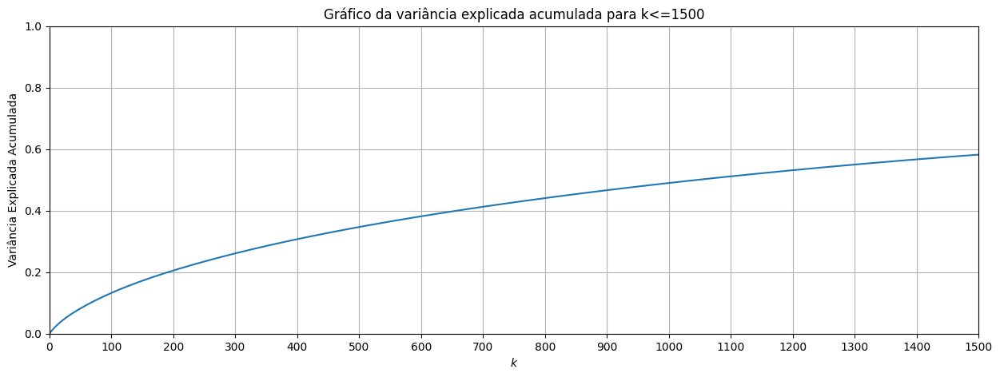

In [23]:
#@title
plt.figure(figsize=(15, 5))
plt.plot(range(1, n_componentes + 1), cum_explained_variance)
plt.ylabel("Variância Explicada Acumulada")
plt.xlabel(r"$k$")
plt.title(f"Gráfico da variância explicada acumulada para k<={n_componentes}")
plt.xticks(np.arange(0, n_componentes+1, step=100))
plt.xlim([0, n_componentes])
plt.ylim([0, 1.0])
plt.grid()
plt.show()

#### Valores Singulares

In [24]:
#valores singulares obtidos do TruncatedSVD
valores_sigulares = truncated_svd.singular_values_

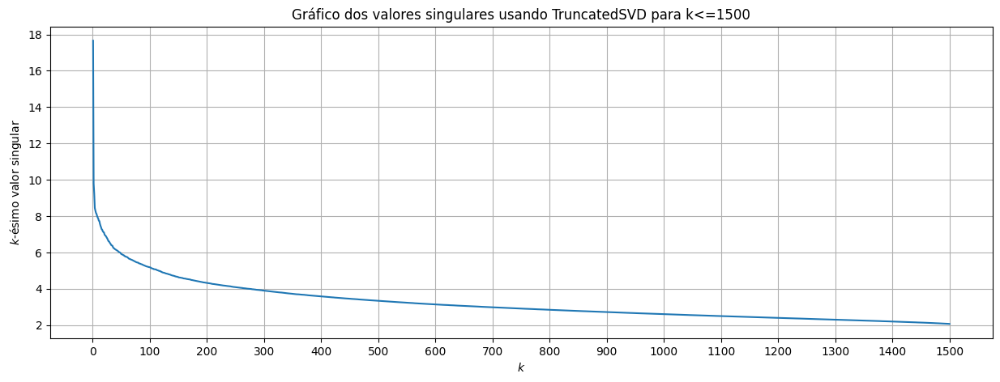

In [25]:
#@title
#gráfico dos valores singulares
plt.figure(figsize=(15, 5))
plt.plot(np.arange(1, len(valores_sigulares) + 1), valores_sigulares)
plt.xlabel(r"$k$")
plt.xticks(np.arange(0, n_componentes+1, step=100))
plt.ylabel(r"$k$-ésimo valor singular")
plt.title(f"Gráfico dos valores singulares usando TruncatedSVD para k<={n_componentes}")
plt.grid()
plt.show()

Como parece haver um cotovelo próximo a k=300, vou replotar o gráfico com esse limite para uma visão mais clara

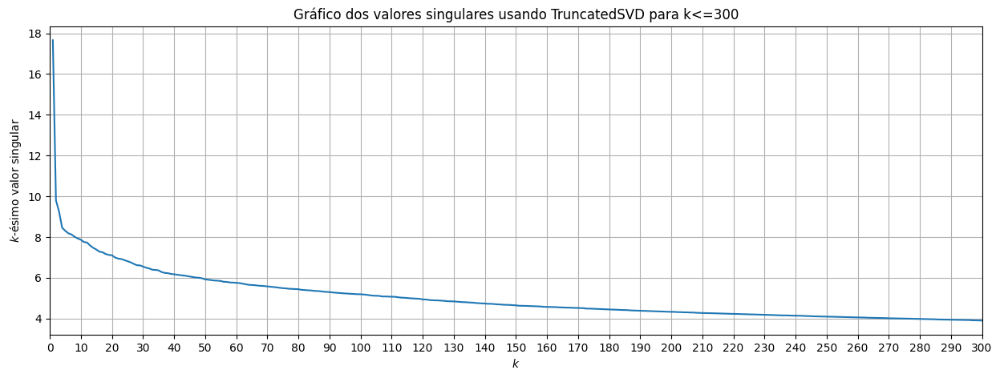

In [26]:
#@title
#gráfico dos valores singulares para k<=300
k_limit = 300
plt.figure(figsize=(15, 5))
plt.plot(np.arange(1, k_limit+1), valores_sigulares[:k_limit])
plt.xticks(np.arange(0, k_limit+1, step=10))
plt.xlim([0, k_limit])
plt.xlabel(r"$k$")
plt.xlim([0, k_limit])
plt.ylabel(r"$k$-ésimo valor singular")
plt.title(f"Gráfico dos valores singulares usando TruncatedSVD para k<={k_limit}")
plt.grid()
plt.show()

Mais um zoom...

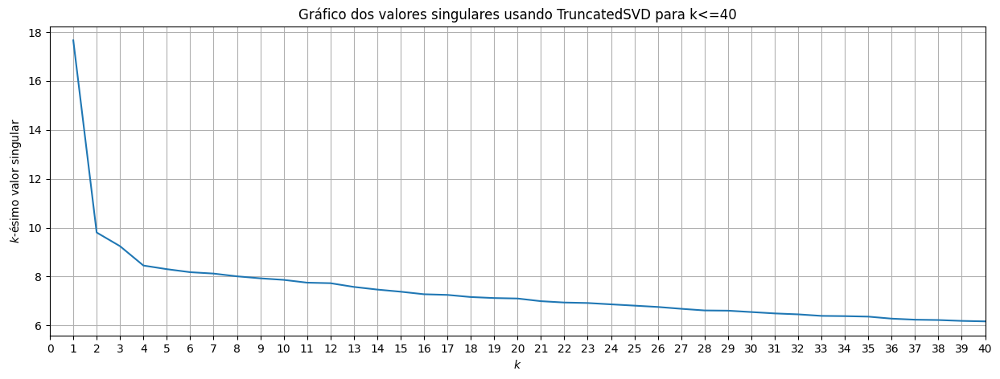

In [27]:
#@title
#gráfico dos valores singulares para k<=60
k_limit = 40
plt.figure(figsize=(15, 5))
plt.plot(np.arange(1, k_limit+1), valores_sigulares[:k_limit])
plt.xticks(np.arange(0, k_limit+1, step=1))
plt.xlim([0, k_limit])
plt.xlabel(r"$k$")
plt.ylabel(r"$k$-ésimo valor singular")
plt.title(f"Gráfico dos valores singulares usando TruncatedSVD para k<={k_limit}")
plt.grid()
plt.show()

Nesse último gráfico, o "cotovelo" parece ocorrer entre 4 e 5. Isso sugere que o rank efetivo pode ser próximo de 5.

Entretanto, observando o primeiro gráfico com k<=1500, percebe-se uma região de cotovelo se estendendo até aproximadamente o k=300, então seria interessante testar esse valor também para um "rank efetivo".

Diante disso, farei o teste de redução de dimensionalidade para k=5, 300 e 1500.

### Redução da dimensionalidade em si

In [28]:
#para k=5
X_tf_idf_k5 = TruncatedSVD(n_components=5, random_state=None).fit_transform(X_tf_idf_nsc)

#para k=300
X_tf_idf_k300 = TruncatedSVD(n_components=300, random_state=None).fit_transform(X_tf_idf_nsc)

#para k=1500
X_tf_idf_k1500 = truncated_svd.transform(X_tf_idf_nsc)

Antes de continuar para a clusterização, vou normalizar as matrizes para a norma L2=1, para que a distância euclidiana seja equivalente em ranking à distância do cosseno. O motivo dessa escolha se dá por conta dos dados textuais, onde a distância do cosseno é particularmente útil, pois não é tão influenciada pelo comprimento dos textos. Além disso, documentos do mesmo tópico, mas com intensidades diferentes, ainda serão similares

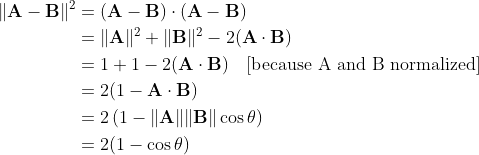

In [29]:
#k=5
X_tf_idf_k5_norm = normalize(X_tf_idf_k5, norm='l2', axis=1)
#guardando a versão em df
df_sinopses_tf_idf_k5_norm = pd.DataFrame(X_tf_idf_k5_norm, index=sinopses_nsc.index)

#k=300
X_tf_idf_k300_norm = normalize(X_tf_idf_k300, norm='l2', axis=1)
#guardando a versão em df
df_sinopses_tf_idf_k300_norm = pd.DataFrame(X_tf_idf_k300_norm, index=sinopses_nsc.index)

#k=1500
X_tf_idf_k1500_norm = normalize(X_tf_idf_k1500, norm='l2', axis=1)
#guardando a versão em df
df_sinopses_tf_idf_k1500_norm = pd.DataFrame(X_tf_idf_k1500_norm, index=sinopses_nsc.index)

## Aplicando K-means

Vou usar a heurística do cotovelo e a métrica da silhueta para achar o melhor número de clusters para cada caso da redução de dimensionalidade anterior. Para redução de custo computacional no cálculo da silhueta, vou aplicar uma quantidade de samples de 10k. Isso gerará uma aproximação do valor real da silhueta, mas não o valor exato.

OBS: É importante notar que o k anterior dizia respeito ao número de componentes/dimensões do TRUNCATED_SVD. O k-means tem os seus k's que representam o número de clusters, então não devem ser confundidos.

Quando eu me referir ao número de componentes, colocarei algo como "dimensões k" ou "SVD_k".

### Dimensão k=5

In [30]:
#lista para armazenar a inércia
inertias = []
#lista para armazenar a silhueta
silhuetas = []
k_values = range(2, 31)

for k in k_values:
  kmeans = KMeans(n_clusters=k, random_state=None)
  labels = kmeans.fit_predict(X_tf_idf_k5_norm)
  inertias.append(kmeans.inertia_)
  score = silhouette_score(X_tf_idf_k5_norm, labels, metric='cosine', sample_size=10000, random_state=None) #coloquei tamanho do sample por conta do custo computacional
  silhuetas.append(score)

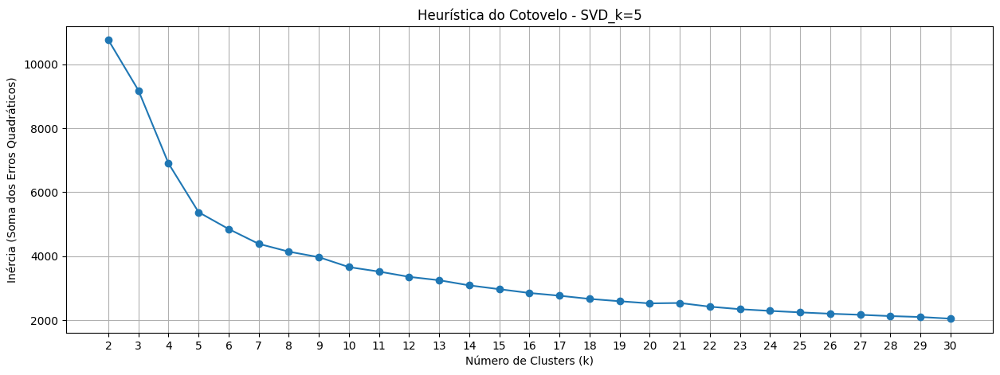

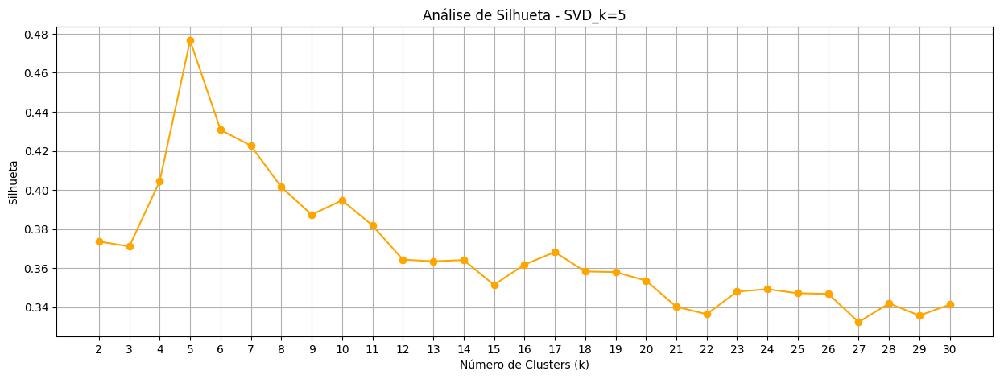

In [31]:
#@title
#plotando o gráfico do cotovelo
plt.figure(figsize=(15, 5))
plt.plot(k_values, inertias, marker='o')
plt.xlabel('Número de Clusters (k)')
plt.xticks(k_values)
plt.ylabel('Inércia (Soma dos Erros Quadráticos)')
plt.title('Heurística do Cotovelo - SVD_k=5')
plt.grid(True)
plt.show()

#plotando o gráfico da silhueta
plt.figure(figsize=(15, 5))
plt.plot(k_values, silhuetas, marker='o', color='orange')
plt.xlabel('Número de Clusters (k)')
plt.xticks(k_values)
plt.ylabel('Silhueta')
plt.title('Análise de Silhueta - SVD_k=5')
plt.grid(True)
plt.show()

Analisando ambos os gráficos, parece haver um cotovelo no k=5 e a curva de silhueta mostra um pico exatamente nesse número de clusters, indicando que a qualidade do agrupamento é melhor para esse valor.

Portanto, vou clusterizar para 5 clusters

In [32]:
n_clusters = 5
kmeans_tfidf_5 = KMeans(n_clusters=n_clusters, random_state=None)
label_tfidf_5 = kmeans_tfidf_5.fit_predict(X_tf_idf_k5_norm)

### Dimensão k=300

In [33]:
#lista para armazenar a inércia
inertias = []
#lista para armazenar a silhueta
silhuetas = []
k_values = range(2, 31)

for k in k_values:
  kmeans = KMeans(n_clusters=k, random_state=None)
  labels = kmeans.fit_predict(X_tf_idf_k300_norm)
  inertias.append(kmeans.inertia_)
  score = silhouette_score(X_tf_idf_k300_norm, labels, metric='cosine', sample_size=1000, random_state=None) #coloquei tamanho do sample por conta do custo computacional
  silhuetas.append(score)

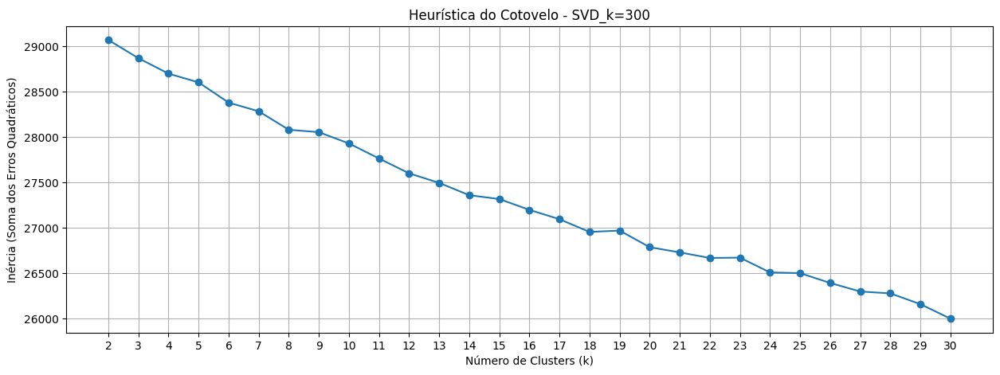

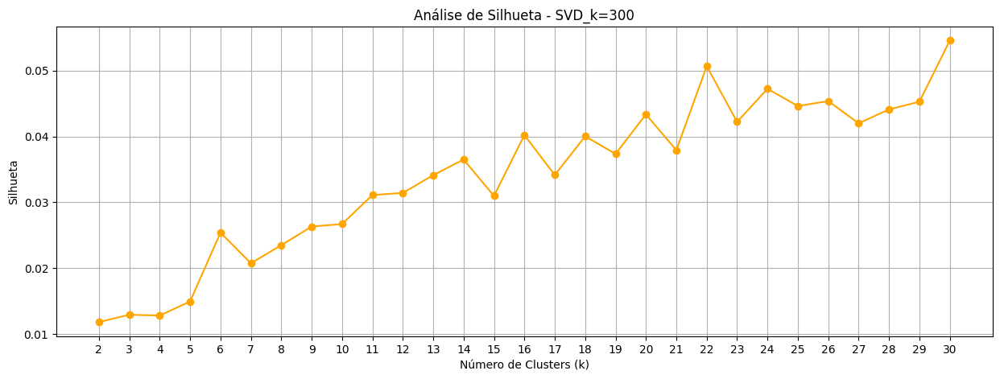

In [34]:
#@title
#plotando o gráfico do cotovelo
plt.figure(figsize=(15, 5))
plt.plot(k_values, inertias, marker='o')
plt.xlabel('Número de Clusters (k)')
plt.xticks(k_values)
plt.ylabel('Inércia (Soma dos Erros Quadráticos)')
plt.title('Heurística do Cotovelo - SVD_k=300')
plt.grid(True)
plt.show()

#plotando o gráfico da silhueta
plt.figure(figsize=(15, 5))
plt.plot(k_values, silhuetas, marker='o', color='orange')
plt.xlabel('Número de Clusters (k)')
plt.xticks(k_values)
plt.ylabel('Silhueta')
plt.title('Análise de Silhueta - SVD_k=300')
plt.grid(True)
plt.show()

Nesse caso, não parece haver um cotovelo e nem um k com destaque realmente evidente na silhueta. Nota-se também que a silhueta máxima para 30 clusters é baixa, próxima de 0,06, o que indica que a separação entre cada grupo não é forte. Considerando que 30 é um valor elevado para clusters - e o aumento de grupos não elevará a silhueta para um valor significativamente próximo de 1, tudo leva a conclusão que a escolha de 300 dimensões na etapa de svd não parece adequada para capturar um sinal claro de agrupamento nos dados.

Apenas para comparação, vou agrupar com o número de clusters do TF-IDF com k=5.

In [35]:
n_clusters = 5
kmeans_tfidf_300 = KMeans(n_clusters=n_clusters, random_state=None)
label_tfidf_300 = kmeans_tfidf_300.fit_predict(X_tf_idf_k300_norm)

### Dimensão k=1500

In [36]:
#lista para armazenar a inércia
inertias = []
#lista para armazenar a silhueta
silhuetas = []
k_values = range(2, 31)

for k in k_values:
  kmeans = KMeans(n_clusters=k, random_state=None)
  labels = kmeans.fit_predict(X_tf_idf_k1500_norm)
  inertias.append(kmeans.inertia_)
  score = silhouette_score(X_tf_idf_k1500_norm, labels, metric='cosine', sample_size=10000, random_state=None) #coloquei tamanho do sample por conta do custo computacional
  silhuetas.append(score)

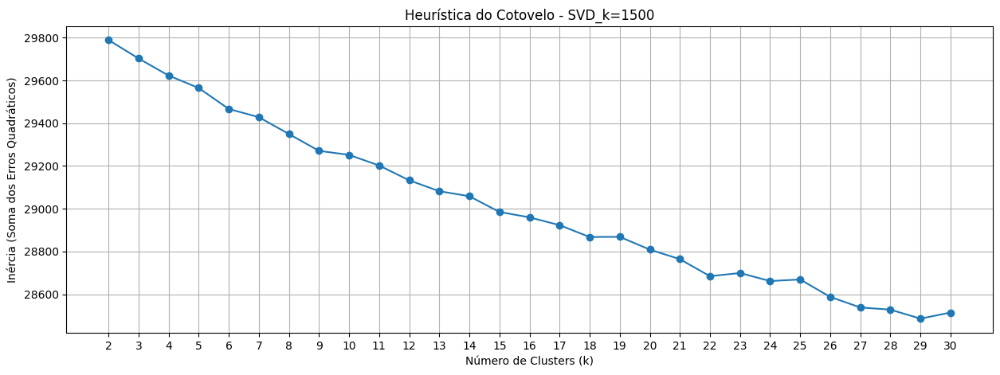

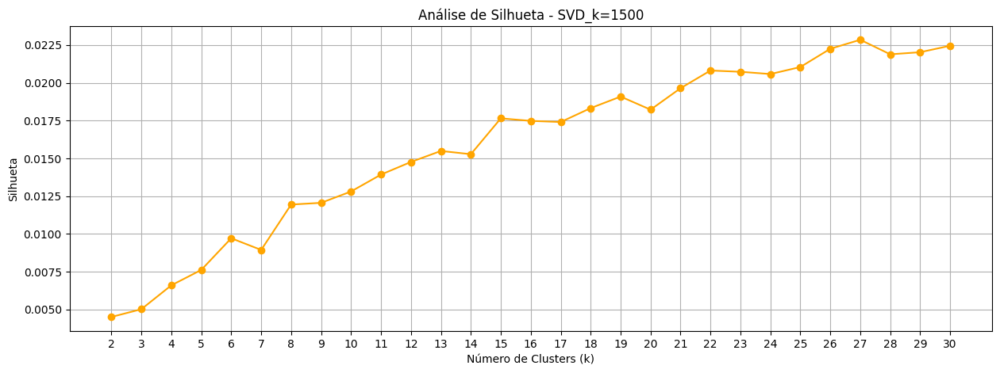

In [37]:
#@title
#plotando o gráfico do cotovelo
plt.figure(figsize=(15, 5))
plt.plot(k_values, inertias, marker='o')
plt.xlabel('Número de Clusters (k)')
plt.xticks(k_values)
plt.ylabel('Inércia (Soma dos Erros Quadráticos)')
plt.title('Heurística do Cotovelo - SVD_k=1500')
plt.grid(True)
plt.show()

#plotando o gráfico da silhueta
plt.figure(figsize=(15, 5))
plt.plot(k_values, silhuetas, marker='o', color='orange')
plt.xlabel('Número de Clusters (k)')
plt.xticks(k_values)
plt.ylabel('Silhueta')
plt.title('Análise de Silhueta - SVD_k=1500')
plt.grid(True)
plt.show()

A mesma análise para o caso de 300 dimensões pode ser aplicada aqui. Apesar de aparecerem pontos de "destaque", a inércia é muito elevada e a silhueta é errante. Ela continuaria mostrando esses picos se o gráfico for plotado com mais valores de k.

1500 componentes na etapa de svd não parecem adequados para capturar uma estrutura clara de agrupamento nos dados. Nem a curva cotovelo, nem a silhueta ajudam a identificar um número adequado de clusters.

Apenas para comparação, vou agrupar com o número de clusters do TF-IDF com k=5.

In [38]:
n_clusters = 5
kmeans_tfidf_1500 = KMeans(n_clusters=n_clusters, random_state=None)
label_tfidf_1500 = kmeans_tfidf_1500.fit_predict(X_tf_idf_k1500_norm)

## Avaliando a performance do k-means

Agora vou pegar os 4 gêneros com maior frequência para investigar se a clusterização faz sentido.

In [39]:
generos_mais_frequentes = count_genres['genres'].iloc[0:4]
todos_os_generos = count_genres['genres'].unique()

In [40]:
cluster_results_kmeans = pd.DataFrame({
    'Movie_Genre': df_filmes['genres'],
    'Movie_Title': df_filmes['primaryTitle'],
    'Movie_Synopsis': df_filmes['sinopse'],
    'Clusters_tf-idf5_k-means=5': label_tfidf_5,
    'Clusters_tf-idf300_k-means=5': label_tfidf_300,
    'Clusters_tf-idf1500_k-means=5': label_tfidf_1500
})

In [41]:
#criando lista para armazenar os df por gênero
lista_dfs = []

#número de clusters esperados para cada gênero. Vai ser usado para preencher com 0 os clusters onde o gênero não possui valores
clusters_esperados = range(5)
for genero in todos_os_generos:
    filtro_genero = cluster_results_kmeans['Movie_Genre'] == genero
    #contar ocorrências e preencher clusters faltantes com 0
    contagens = {
        'TF-IDF 5': cluster_results_kmeans.loc[filtro_genero, 'Clusters_tf-idf5_k-means=5'].value_counts().reindex(clusters_esperados, fill_value=0),
        'TF-IDF 300': cluster_results_kmeans.loc[filtro_genero, 'Clusters_tf-idf300_k-means=5'].value_counts().reindex(clusters_esperados, fill_value=0),
        'TF-IDF 1500': cluster_results_kmeans.loc[filtro_genero, 'Clusters_tf-idf1500_k-means=5'].value_counts().reindex(clusters_esperados, fill_value=0)
    }
    #criando o df para o gêner
    df_genero = pd.DataFrame({
        'Movie_Genre': genero,
        'Cluster': clusters_esperados,
        'TF-IDF 5': contagens['TF-IDF 5'].values,
        'TF-IDF 300': contagens['TF-IDF 300'].values,
        'TF-IDF 1500': contagens['TF-IDF 1500'].values
    })

    lista_dfs.append(df_genero)

#concatenando tudop
cluster_counts_df = pd.concat(lista_dfs, ignore_index=True)
cluster_counts_df_generos_mais_frequentes = cluster_counts_df[cluster_counts_df['Movie_Genre'].isin(generos_mais_frequentes)]
cluster_counts_df_generos_mais_frequentes.head(10)


,Movie_Genre,Cluster,TF-IDF 5,TF-IDF 300,TF-IDF 1500
0,Romance,0,263,1575,3056
1,Romance,1,1756,1555,1505
2,Romance,2,810,2823,65
3,Romance,3,2390,476,601
4,Romance,4,1566,356,1558
5,Crime,0,1872,757,2438
6,Crime,1,169,124,123
7,Crime,2,585,2423,700
8,Crime,3,994,242,380
9,Crime,4,757,831,736


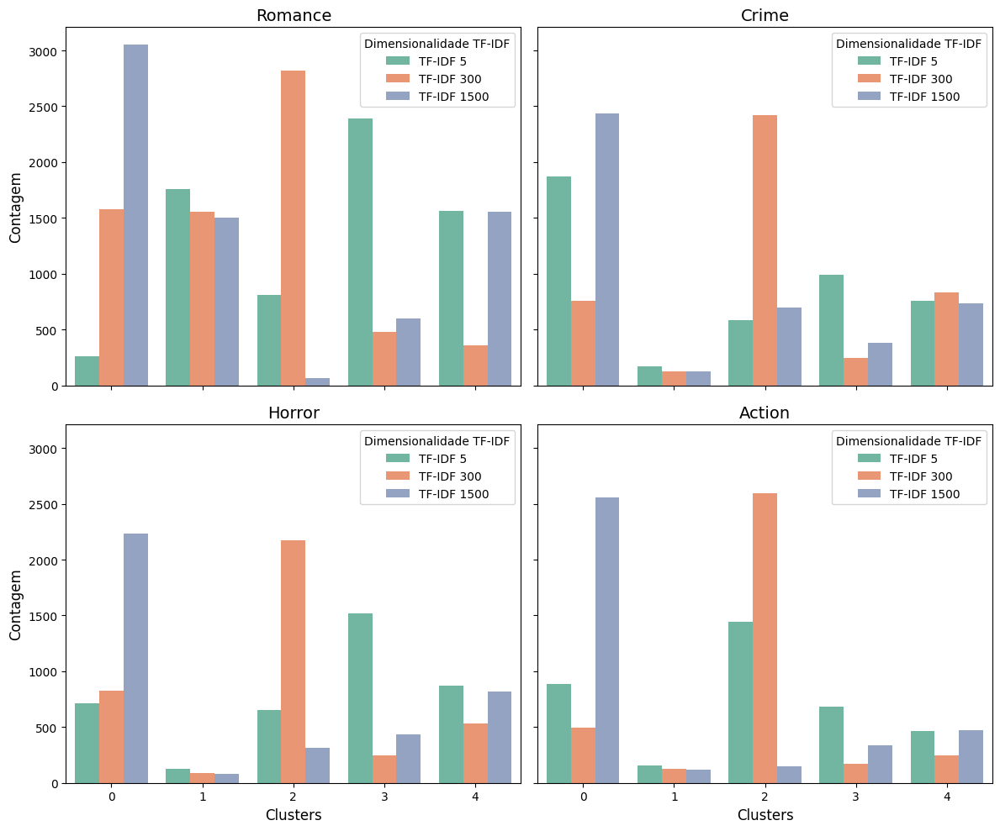

In [42]:
#vou deixar o df em formato "melted" para o plot ficar mais fácil
df_melted = cluster_counts_df_generos_mais_frequentes.melt(id_vars=['Movie_Genre', 'Cluster'], var_name='TF-IDF Dimensões', value_name='Contagem')

#criando os subplots para cada gênero
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10), sharex=True, sharey=True)

# fazendo o plor para cada g^enero
for ax, genero in zip(axes.flat, generos_mais_frequentes):
  df_genero = df_melted[df_melted['Movie_Genre'] == genero]
  sns.barplot(data=df_genero, x='Cluster', y='Contagem', hue='TF-IDF Dimensões', ax=ax, palette='Set2')
  ax.set_title(f'{genero}', fontsize=14)
  ax.set_xlabel('Clusters', fontsize=12)
  ax.set_ylabel('Contagem', fontsize=12)
  ax.legend(title="Dimensionalidade TF-IDF")

#ajustando o layout e plotando
plt.tight_layout()
plt.show()


Não se percebe nenhum sinal claro nos casos de 300 e 1500 dimensões, logo, prosseguirei com o caso de 5 dimensões:

#### Contagem de sinopses de cada gênero em cada cluster, para o caso do TF-IDF com 5 dimensões

In [43]:
resultado_agrupado = cluster_counts_df.groupby(['Cluster', 'Movie_Genre'])[['TF-IDF 5']].sum().reset_index().rename(columns={'TF-IDF 5':'QNT_SINOPSES'})

filtro = (resultado_agrupado['QNT_SINOPSES']>0)

cinco_principais_genero_por_cluster = resultado_agrupado[filtro].groupby('Cluster')[['Cluster', 'Movie_Genre', 'QNT_SINOPSES']].apply(lambda x: x.nlargest(5, 'QNT_SINOPSES')).reset_index(drop=True).sort_values(by=['Cluster', 'QNT_SINOPSES'], ascending=[True, False])

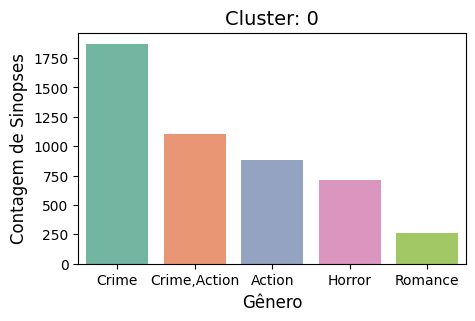

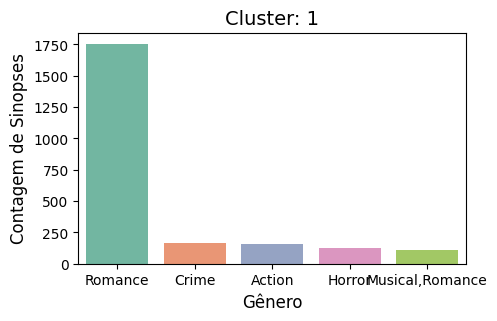

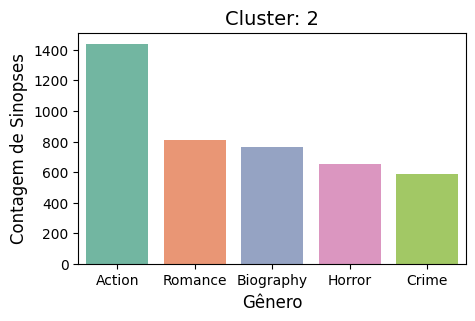

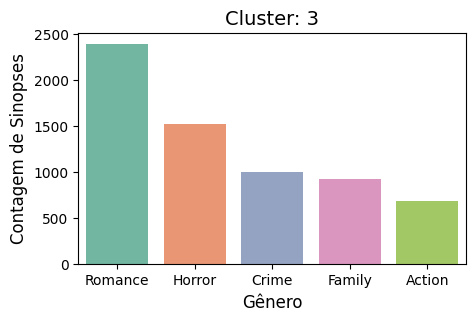

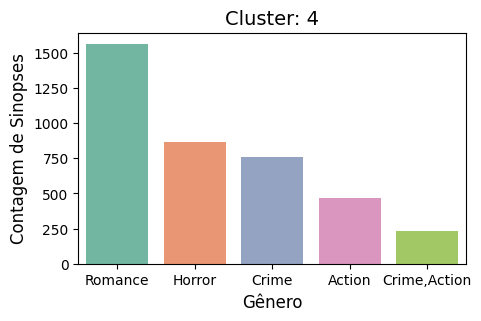

In [44]:
#para cada cluster
for cluster in cinco_principais_genero_por_cluster['Cluster'].unique():
  df_genero = cinco_principais_genero_por_cluster[cinco_principais_genero_por_cluster['Cluster'] == cluster]

  plt.figure(figsize=(5, 3))
  sns.barplot(data=df_genero, x='Movie_Genre', y='QNT_SINOPSES', hue='Movie_Genre', palette='Set2')

  plt.title(f'Cluster: {cluster}', fontsize=14)
  plt.xlabel('Gênero', fontsize=12)
  plt.ylabel('Contagem de Sinopses', fontsize=12)
  plt.show()


Percebe-se que os cluster não são tão bem separados, e os gêneros mais comuns são também gêneros com maior quantidade de resgistros no data set. Os clusters mais bem definidos são o 0 e 2, onde o 0 se concentra em Crime e o 2 se concentra em ação.

#### Gerando a nuvem de palavras

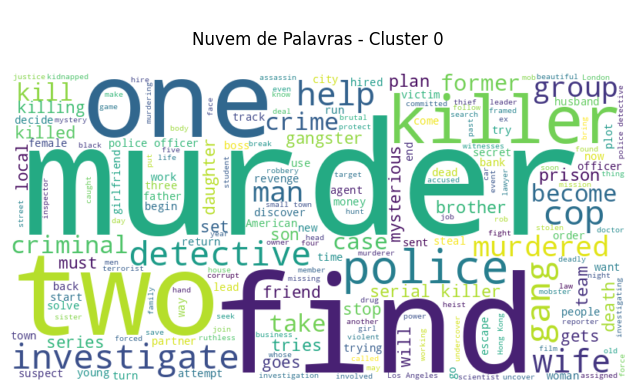

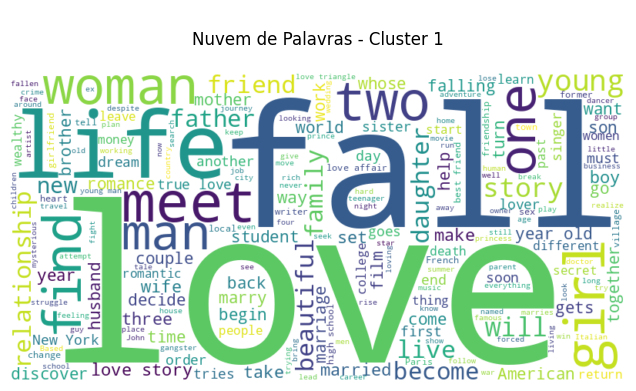

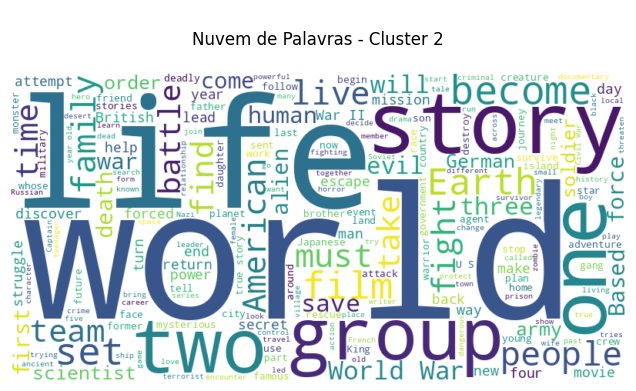

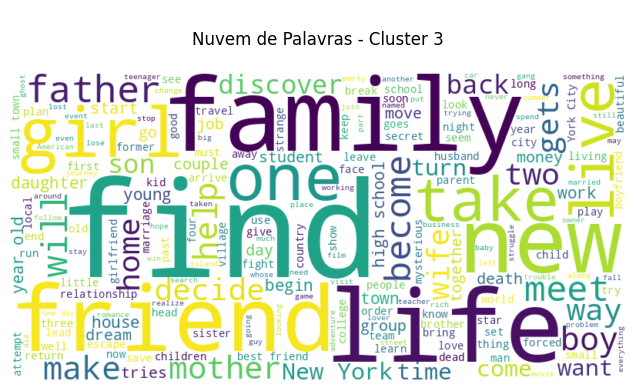

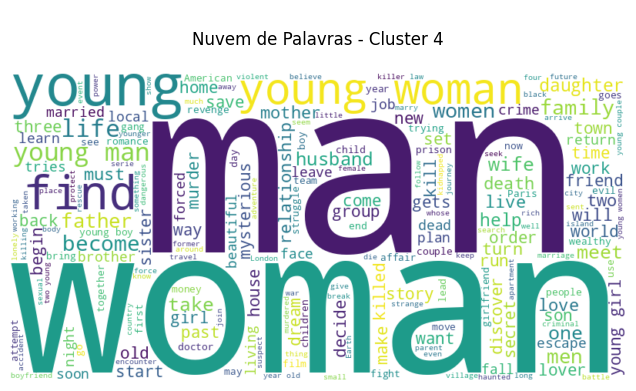

In [45]:
from wordcloud import WordCloud

#numero de clusters
num_clusters = cluster_results_kmeans["Clusters_tf-idf5_k-means=5"].nunique()

for cluster in range(num_clusters):
  cluster_texts = " ".join(cluster_results_kmeans[cluster_results_kmeans["Clusters_tf-idf5_k-means=5"] == cluster]["Movie_Synopsis"])

  #criando a nuvem de palavras
  wordcloud = WordCloud(
    width=800, height=400, background_color='white', colormap='viridis'
  ).generate(cluster_texts)

  plt.figure(figsize=(8, 4))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.title(f"\nNuvem de Palavras - Cluster {cluster}\n")
  plt.show()

## Análise dos resultados do K-means

Podemos perceber que os casos de dimensionalidade de 300 e 1500 não tiveram bons resultados, sendo a maioria dos dados empurrados para um cluster específico, o que indica um agrupamento ruim. Um possível explicação pode ser a maldição da dimensionalidade, pois, em altas dimensões, todos os pontos tendem a ficar igualmente distantes.

Analisando para a dimensão 5, percebe-se muito "ruído", já que o sinal dos dados foi perdido ao realizar uma redução de dimensionalidade agressiva de 13512 features para apenas 5 componentes, mas, ainda assim, percebe-se tendências interessantes em alguns dos clusters:

**ROMANCES**:

O grupo predominante dos **ROMANCES** é o 1, mas esse gênero se distribui para todos os outros clusters, com menor frequência no clusters 0, onde se destacam os gêneros Crime e Ação, respectivamente. Uma possível explicação - além da baixa variância explicada - é que as sinopses dos Romances podem se "diluir" nos outros clusters, por ser um gênero muito flexível.

**CRIME**:

Esse gênero mostrou uma forte tendência de pertencer ao cluster 0, o que é interessante. A núvem de palavras mostra que termos como "Murder" e "killer" são frequentes nesse cluster.  O outro gênero com uma expressão considerável para o cluster 0 é o Ação, o que é, de certa forma, intuitivo.

**TERROR**:

Esse gênero parece distribuído, com maior frequência no cluster 3. Também aparece muito no cluster 0 e 4, sendo o 0 representante do gênero Crime. Entretanto, percebe-se que não houve agrupamento claro para terror.

**AÇÃO**:

É interessante pensar que esse gênero é predominante no cluster 2, enquanto as palavras mais comuns foram "world", "story", "life" e "one". O que isso poderia dizer não parece tão claro.

OBS: os clusters podem mudar caso o código seja rodado novamente, pois coloquei o random_state=None

As nuvens de palavras mostram que os clusters 1, 3 e 4 compartilham, de certa forma, uma ideia comum de romance, com palavras como "love" e "fall" tão frequentes, talvez relacionado a "fall in love",  assim como "young" é forte junto de "man", "girl", "woman", find e "life".

Apesar do resultado não ter se mostrado satisfatório (talvez por maldição da dimensionalidade? clusters não "circulares"? Ineficiência do K-means para o tipo de dado?...), ainda assim é possível ver uma certa "cara" em alguns dos clusters, como no caso do 0 e 2, com os gêneros ação e crime.

Por fim, abordando as perguntas do professor:

---

Como foi escolhido o número de componentes principais para o PCA? O número de componentes principais tem um impacto significativo nos resultados? É necessário usar PCA neste trabalho?

R: o número de componentes foi escolhido tentando preservar mais da metade da variância dos dados originais. O número de componentes tem muito impacto nos resultados, onde valores de 5, 300 e 1500 obtiveram resultados variados. Para a abordagem do k-means, um redução de dimensionalidade foi essencial, mas não o PCA, uma vez que o Truncated SVD lida melhor com dados esparsos.


Como o número de grupos para cada algoritmo de agrupamento foi definido? A escolha do algoritmo de agrupamento impacta significativamente os resultados? E o número de grupos?

R: O número de grupos foi escolhido observando a heurística do cotovelo e a análise de silhueta, no caso do k-means. O resto da pergunta será respondida mais a frente.

# Agrupamento Espectral


Como o Kmeans não mostrou agrupamentos satisfatórios, vou testar o Agrupamento Espectral, porém, por conta de recursos computacionais do colab, farei uma redução no número de registros por meio de amostragem estratificada, proporcional aos gêneros, para manter as caracteristicas dos dados.

Abaixo encontram-se as especificações da máquina do colab:

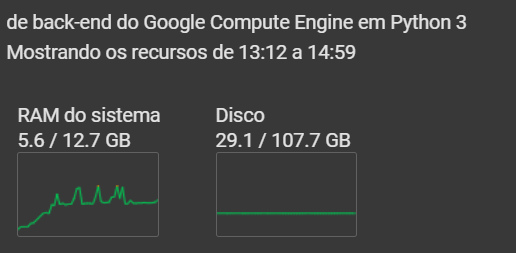

Dos 30358 registros originais, pegarei 35% deles. Cerca de 10625 registros.

OBS: o sklearn faz separação estratificada no train_test_split, mas cada grupo (gênero), precisa ter pelo menos 2 registros, logo, vou eliminar gêneros com apenas 1 registro. Esses casos acontecem especificamente onde existem valores concatenados na coluna 'genres'

## Pré-Processamento dos dados

### Fazendo todas as etapas para se obter a matriz TF-IDF

In [66]:
from sklearn.model_selection import train_test_split

#redução do número de registros do df
df_reduzido = df_filmes[df_filmes['genres'].isin(count_genres['genres'][count_genres['count']>=2])]
df_reduzido, _ = train_test_split(df_reduzido, test_size=0.65, stratify=df_reduzido["genres"], random_state=None)
print(f"Agora o DF tem {df_reduzido.shape[0]} linhas, ao invés de {df_filmes.shape[0]} do DF original.")

Agora o DF tem 10622 linhas, ao invés de 30358 do DF original.


In [67]:
#pegando as sinopses sem caracteres especiais (obs: abreviação para no special char = nsc)
df_reduzido['sinopse_processed'] = sinopses_pre_processing(df_reduzido['sinopse'], convert_special_char=True)
sinopses_nsc_reduzido = df_reduzido['sinopse_processed']

#aplicando tf-idf:
X_tf_idf_reduzido = get_tf_idf_matrix(sinopses_nsc_reduzido, max_df=0.99, min_df=3)

m, n = X_tf_idf_reduzido.shape
total_elementos = m * n
n_nao_zeros = X_tf_idf_reduzido.nnz

densidade = n_nao_zeros / total_elementos
esparsidade = 1 - densidade

print("Dimensões da matriz:", m, "x", n)
print(f"Número de elementos não zero: {n_nao_zeros}")
print(f"Densidade da matriz: {densidade:.4f}")
print(f"Esparsidade da matriz: {esparsidade:.4f}")

Dimensões da matriz: 10622 x 7384
Número de elementos não zero: 172837
Densidade da matriz: 0.0022
Esparsidade da matriz: 0.9978


### Redução de dimensionalidade

In [68]:
#Aplicando a redução de dimensionalidade para 800 dimensões
n_componentes = 800

svd = TruncatedSVD(n_components=n_componentes, random_state=None)
svd.fit(X_tf_idf_reduzido) #ainda não transformado, apenas fit

#avaliando a variância explicada
explained_variance = svd.explained_variance_ratio_.sum()
cum_explained_variance = np.cumsum(svd.explained_variance_ratio_)

print(f"{n_componentes} componentes explicam {explained_variance:.5f} ({explained_variance:.2%}) da variância do df TF-IDF das sinopses com {n} features.\nIsso representa uma diminuição de {1-n_componentes/n:.2%} no número de features.")



800 componentes explicam 0.51778 (51.78%) da variância do df TF-IDF das sinopses com 7384 features.
Isso representa uma diminuição de 89.17% no número de features.


Abaixo vou plotar os gráficos de variância e explicada e valores singulares para analisar o comportamento para esse df resumido:

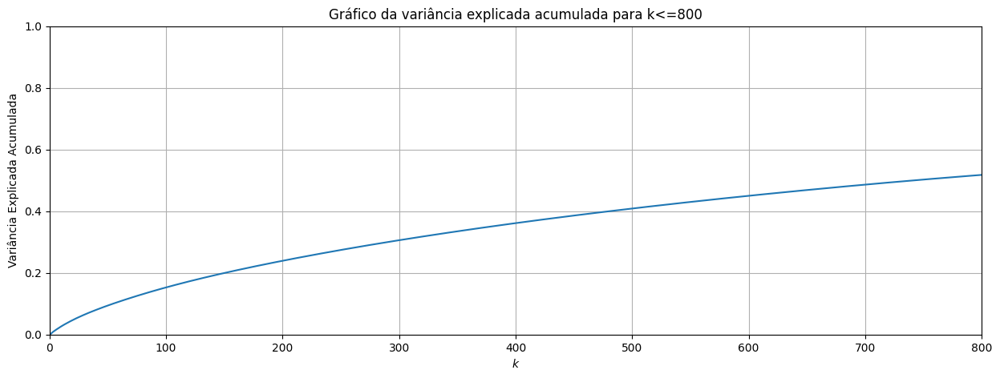

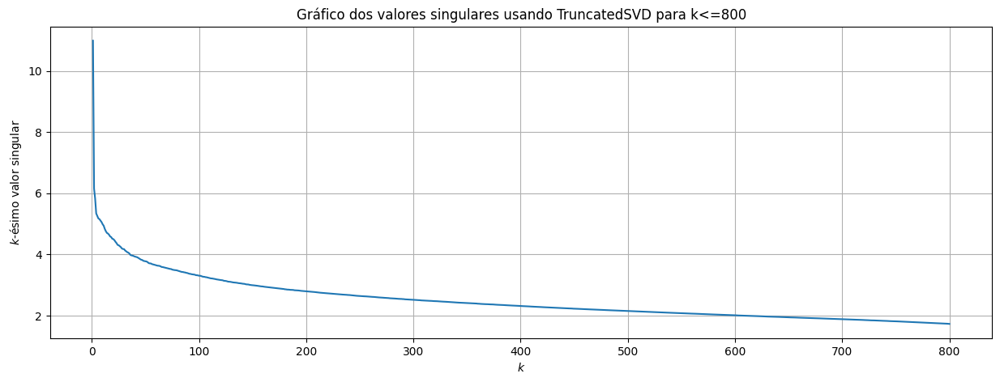

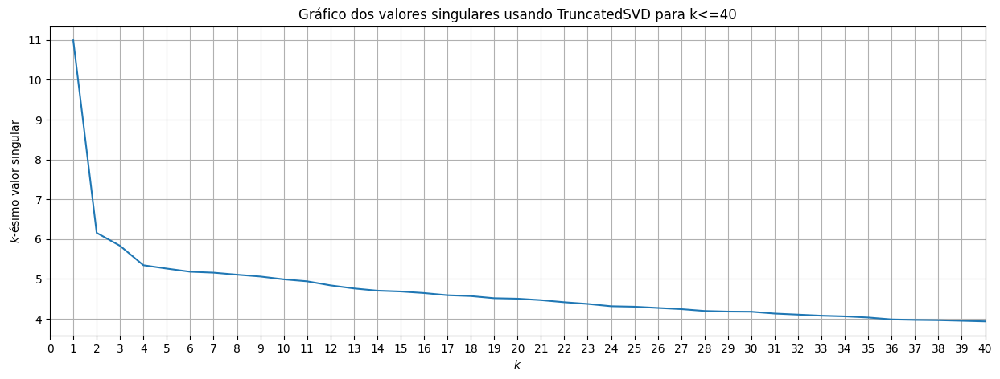

In [69]:
#@title
plt.figure(figsize=(15, 5))
plt.plot(range(1, n_componentes + 1), cum_explained_variance)
plt.ylabel("Variância Explicada Acumulada")
plt.xlabel(r"$k$")
plt.title(f"Gráfico da variância explicada acumulada para k<={n_componentes}")
plt.xticks(np.arange(0, n_componentes+1, step=100))
plt.xlim([0, n_componentes])
plt.ylim([0, 1.0])
plt.grid()
plt.show()

#valores singulares obtidos do TruncatedSVD
valores_sigulares = svd.singular_values_

#@title
#gráfico dos valores singulares
plt.figure(figsize=(15, 5))
plt.plot(np.arange(1, len(valores_sigulares) + 1), valores_sigulares)
plt.xlabel(r"$k$")
plt.xticks(np.arange(0, n_componentes+1, step=100))
plt.ylabel(r"$k$-ésimo valor singular")
plt.title(f"Gráfico dos valores singulares usando TruncatedSVD para k<={n_componentes}")
plt.grid()
plt.show()

#@title
#gráfico dos valores singulares para k<=60
k_limit = 40
plt.figure(figsize=(15, 5))
plt.plot(np.arange(1, k_limit+1), valores_sigulares[:k_limit])
plt.xticks(np.arange(0, k_limit+1, step=1))
plt.xlim([0, k_limit])
plt.xlabel(r"$k$")
plt.ylabel(r"$k$-ésimo valor singular")
plt.title(f"Gráfico dos valores singulares usando TruncatedSVD para k<={k_limit}")
plt.grid()
plt.show()

Como o comportamento parece o mesmo do svd realizado no kmeans, continuarei com 800 componentes para tentar os agrupamentos

In [70]:
#transformando com o truncated svd
X_tf_idf_reduzido_truncated = svd.transform(X_tf_idf_reduzido)

### Avaliação da medida Eigengap

Antes de aplicar o agrupamento espectral, vou usar a medida eigengap que o professor ensinou, para observar se tem um número de cluster ótimo.

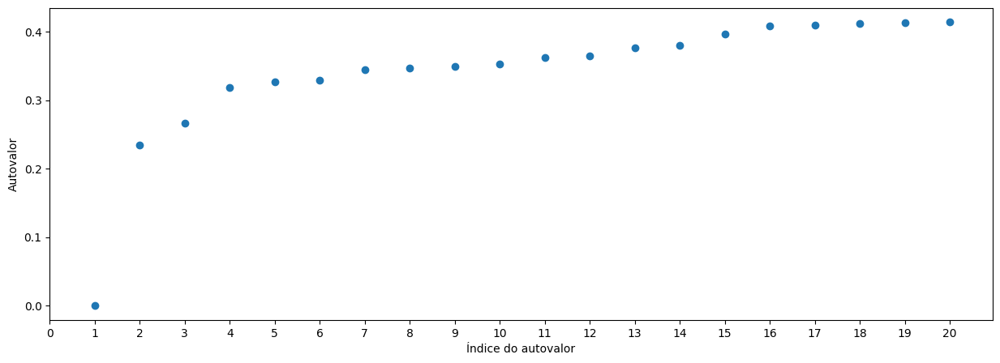

In [71]:
from sklearn.neighbors import kneighbors_graph
from scipy.sparse import csgraph
from numpy import linalg as LA

# 1 Construindo a matriz de adjacências do grafo de vizinhos mais próximos.
G = kneighbors_graph(X_tf_idf_reduzido_truncated, n_neighbors = 10, include_self = True)
A = 0.5 * (G + G.T)

# 2 Construindo a Laplaciana Normalizada
L = csgraph.laplacian(A, normed = True).todense()

# 3 Obtendo os autovalores da Laplaciana Normalizada
# Valores já estão ordenados em ordem crescente.
values, _ = LA.eigh(L)

# 4 Plotando os valores dos 'gaps' e escolhendo um k adequado.
plt.figure(figsize=(15, 5))
plt.scatter([i for i in range(1, 21)], values[:20])
plt.xlabel('Índice do autovalor')
plt.xticks(np.arange(0, 21, step=1))
plt.ylabel('Autovalor')
plt.show()


Como o maior "gap" está em 1 cluster, significa que o "melhor" agrupamento seria para essa quantidade de grupos, o que não nos leva a lugar algum. Desse modo, testarei com o valor onde o ganho no eixo y é o segundo maior, quer seria para 3 clusters.

## Agrupamento Espectral com 3 clusters

In [72]:
from sklearn.cluster import SpectralClustering

def gera_cluster_spectral(df, n_clusters, n_neightbors=10):
  nclusters = n_clusters
  m = SpectralClustering(n_clusters = nclusters, affinity = 'nearest_neighbors', n_neighbors = 15)
  m.fit(df)

  labels_sc = m.labels_

  cluster_results_spectral_clustering = pd.DataFrame({
    'Movie_Genre': df_reduzido['genres'],
    'Movie_Title': df_reduzido['primaryTitle'],
    'Movie_Synopsis': df_reduzido['sinopse'],
    'Cluster_sc': labels_sc
  })

  return cluster_results_spectral_clustering, labels_sc

In [73]:
n_clusters_sc = 3

In [74]:
cluster_results_spectral_clustering, labels_sc = gera_cluster_spectral(X_tf_idf_reduzido_truncated, n_clusters_sc, 10)

Plotando a quantidade de registros nos clusters

In [75]:
cluster_results_spectral_clustering['Cluster_sc'].value_counts()

,count
Cluster_sc,
0,10589
2,22
1,11


Percebe-se de imediato que o agrupamento ficou extremamente desbalanceado.

Gerando os gráficos de gênero por cluster

In [76]:
#@title
def gera_graficos_gero_por_cluster(df_cluster, todos_os_generos, nclusters):
  #criando lista para armazenar os df por gênero
  lista_dfs = []
  #número de clusters esperados para cada gênero. Vai ser usado para preencher com 0 os clusters onde o gênero não possui valores
  clusters_esperados = range(nclusters)
  for genero in todos_os_generos:
    filtro_genero = df_cluster['Movie_Genre'] == genero
    #contar ocorrências e preencher clusters faltantes com 0
    contagens = {
      'contagem': df_cluster.loc[filtro_genero, 'Cluster_sc'].value_counts().reindex(clusters_esperados, fill_value=0),
      }
    #criando o df para o gênero
    df_genero = pd.DataFrame({
      'Movie_Genre': genero,
      'Cluster': clusters_esperados,
      'Contagem': contagens['contagem'].values
    })

    lista_dfs.append(df_genero)

  #concatenando tudop
  cluster_counts_df = pd.concat(lista_dfs, ignore_index=True)
  resultado_agrupado = cluster_counts_df.groupby(['Cluster', 'Movie_Genre'])[['Contagem']].sum().reset_index().rename(columns={'Contagem':'QNT_SINOPSES'})
  filtro = (resultado_agrupado['QNT_SINOPSES']>0)
  cinco_principais_genero_por_cluster = resultado_agrupado[filtro].groupby('Cluster')[['Cluster', 'Movie_Genre', 'QNT_SINOPSES']].apply(lambda x: x.nlargest(5, 'QNT_SINOPSES')).reset_index(drop=True).sort_values(by=['Cluster', 'QNT_SINOPSES'], ascending=[True, False])

  #para cada cluster
  for cluster in cinco_principais_genero_por_cluster['Cluster'].unique():
    df_genero = cinco_principais_genero_por_cluster[cinco_principais_genero_por_cluster['Cluster'] == cluster]
    plt.figure(figsize=(10, 3))
    sns.barplot(data=df_genero, x='Movie_Genre', y='QNT_SINOPSES', hue='Movie_Genre', palette='Set2')
    plt.title(f'Gêneros mais comuns no Cluster: {cluster}', fontsize=14)
    plt.xlabel('Gênero', fontsize=12)
    plt.ylabel('Contagem de Sinopses', fontsize=12)
    plt.show()
    print('\n')




### Gêneros por Clusters

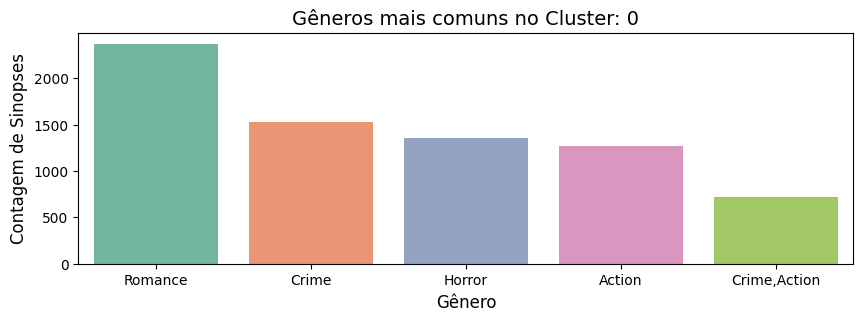

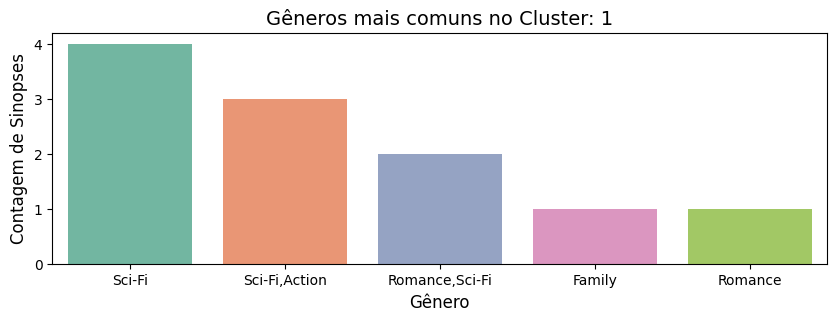

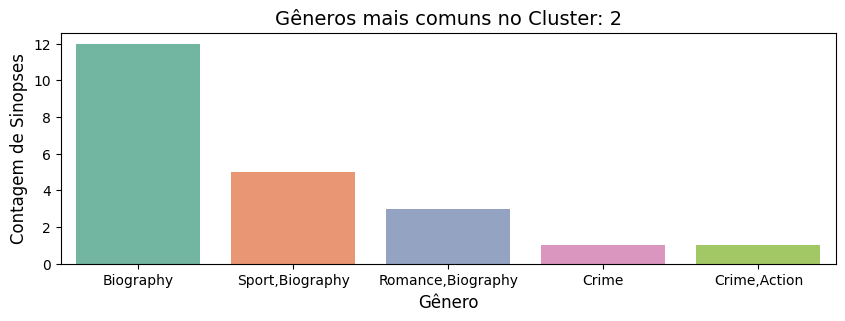

In [77]:
gera_graficos_gero_por_cluster(cluster_results_spectral_clustering, todos_os_generos, n_clusters_sc)

É interessante notar, entretanto, que tiveram alguma tendência de resultados.

O primeiro grupo, entretanto, agrupou a maior parte das sinopses, com grande presença de gêneros "clássicos", como romance, crime, terror e ação, mas esses são também os gêneros com a maior predominância nos dados, como pode-se ver abaixo:

In [78]:
#@title
count_genres.head()

,genres,count,Porcentagem
0,Romance,6785,22.35
1,Crime,4377,14.42
2,Horror,3875,12.76
3,Action,3630,11.96
4,"Crime,Action",2049,6.75


O segundo e terceiro clusters apresentaram fortes sinais de um agrupamento adequado, mostrando coerência principalmente nos gêneros Sci-fi (grupo 2) e Biografias (grupo 3). Vejamos a nuvem de palavras:

### Nuvem de palavras

In [79]:
#@title
def nuvem_palavras (df_cluster, nome_cluster):
  #numero de clusters
  num_clusters = df_cluster[nome_cluster].nunique()

  for cluster in range(num_clusters):
    cluster_texts = " ".join(df_cluster[df_cluster[nome_cluster] == cluster]["Movie_Synopsis"])

    #criando a nuvem de palavras
    wordcloud = WordCloud(
      width=800, height=400, background_color='white', colormap='viridis'
    ).generate(cluster_texts)

    plt.figure(figsize=(8, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"\nNuvem de Palavras - Cluster {cluster}\n")
    plt.show()

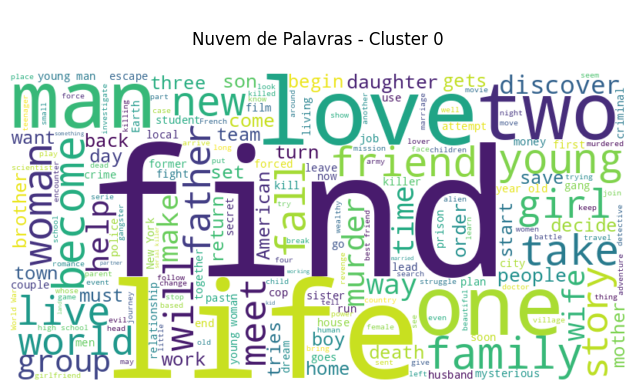

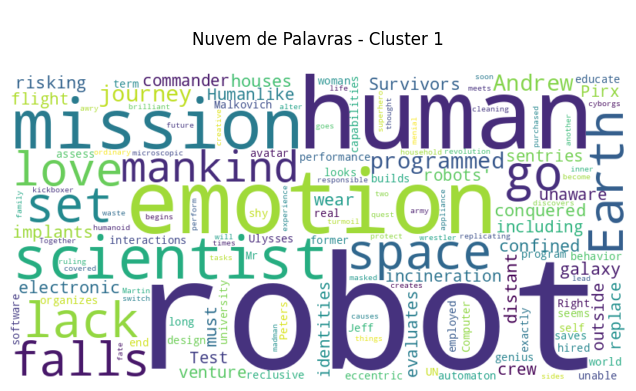

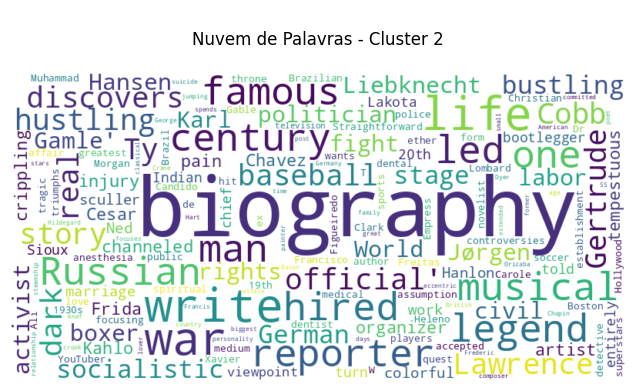

In [80]:
nuvem_palavras(cluster_results_spectral_clustering, 'Cluster_sc')

Analisarei agora o resultado para mais clusters. Olhando novamente o gráfico da medida eigengap, parece haver um pequeno gap maior que seus vizinhos nas regiões de 7 e 14 clusters. Testarei com ambos:

In [81]:
agrupamento_espectral_k7, labels_sc = gera_cluster_spectral(X_tf_idf_reduzido_truncated, 7, 10)
agrupamento_espectral_k14, labels_sc = gera_cluster_spectral(X_tf_idf_reduzido_truncated, 14, 10)

## Agrupamento espectral com 7 clusters

### Gêneros por Clusters

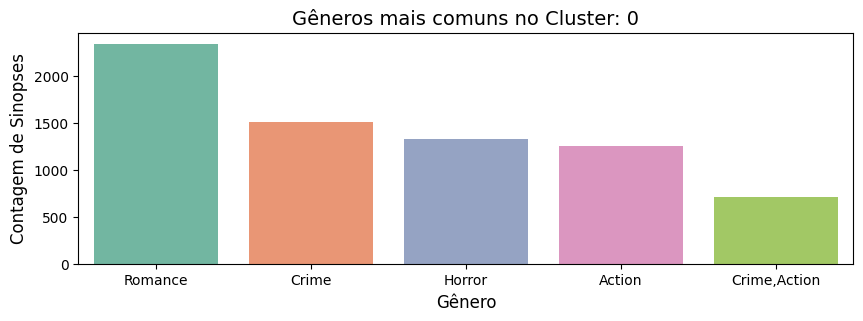

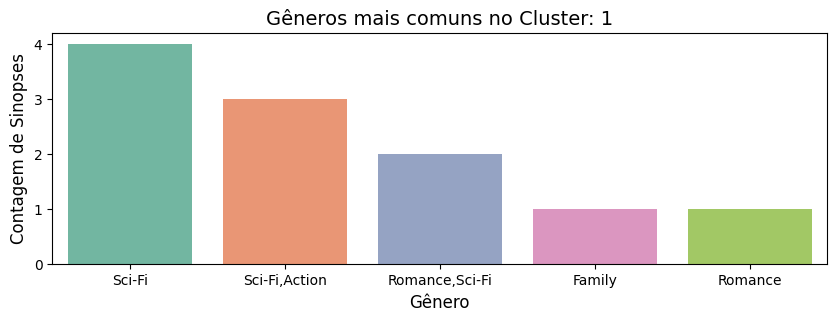

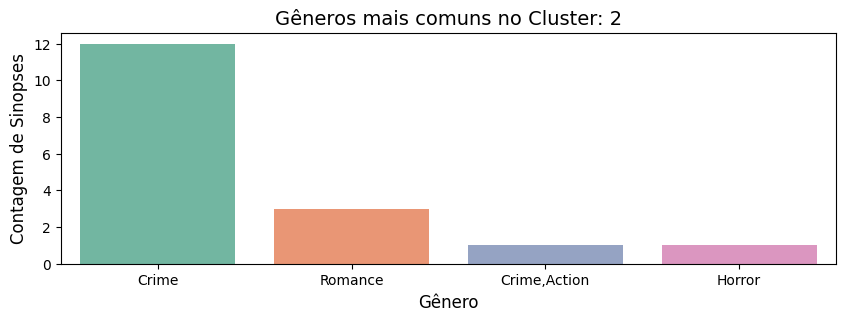

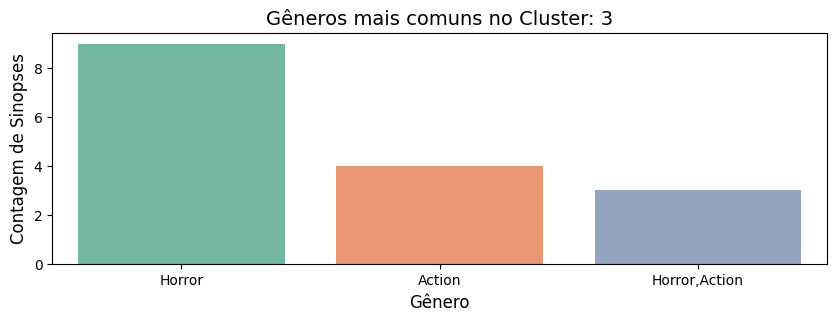

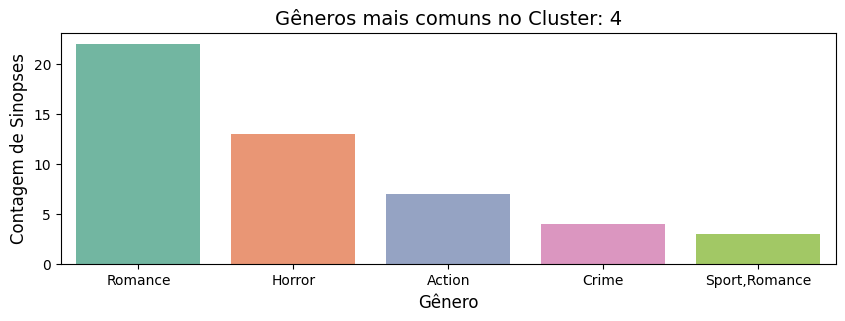

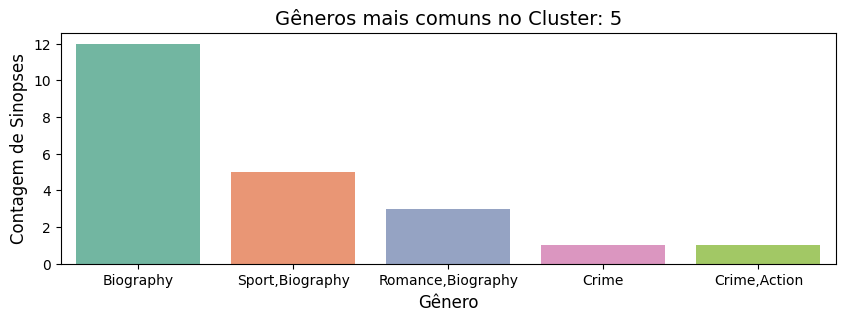

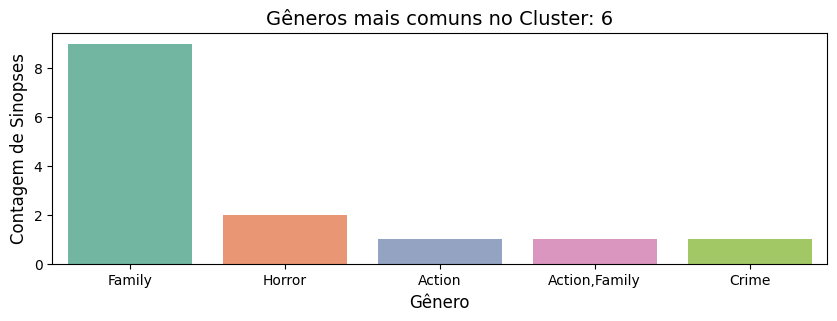

In [82]:
#Para 7 clusters
gera_graficos_gero_por_cluster(agrupamento_espectral_k7, todos_os_generos, 7)

### Nuvem de palavras

Gerando núvem

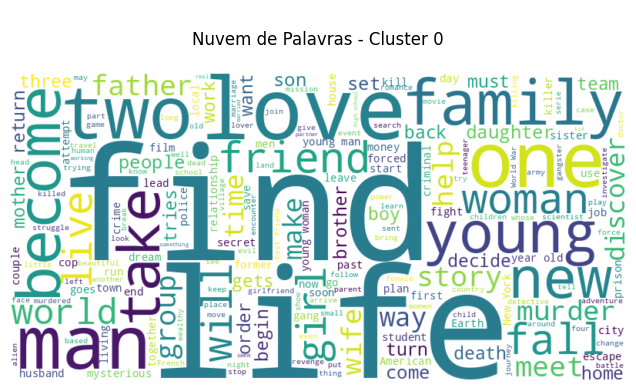

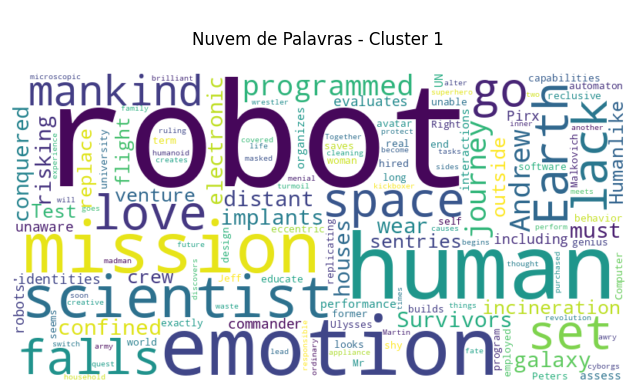

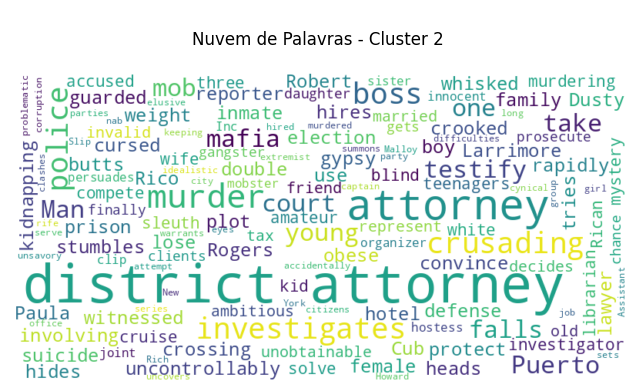

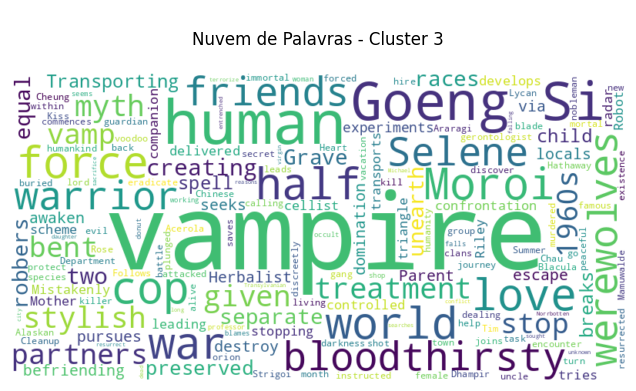

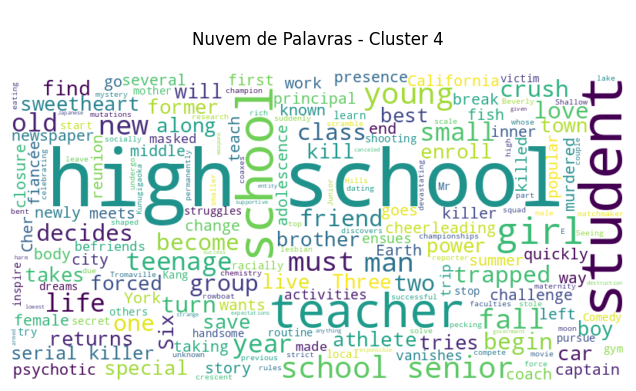

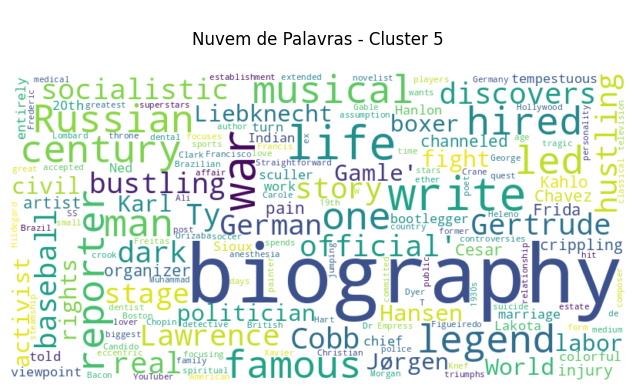

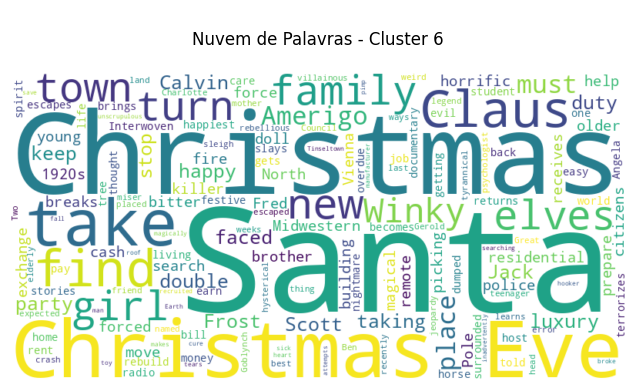

In [83]:
nuvem_palavras(agrupamento_espectral_k7, 'Cluster_sc')

## Agrupamento Espectral com 14 clusters

### Gênero por clusters

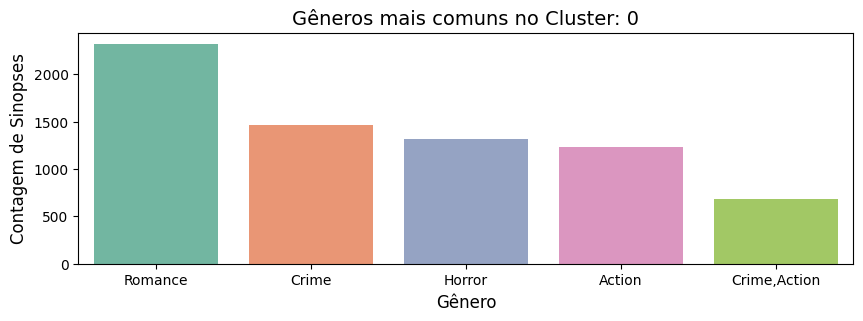

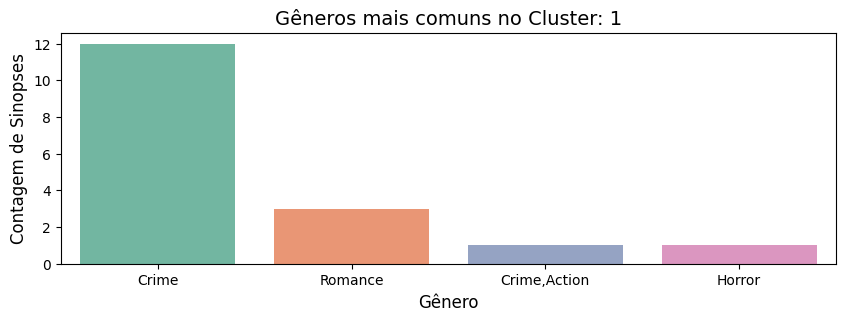

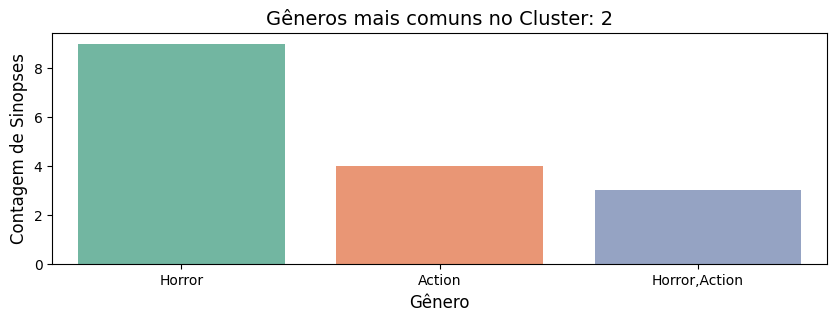

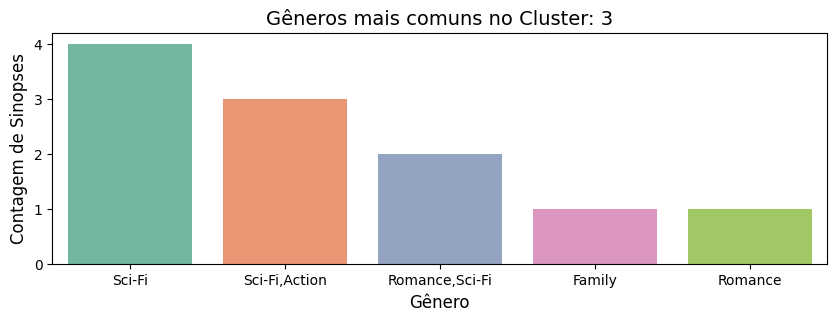

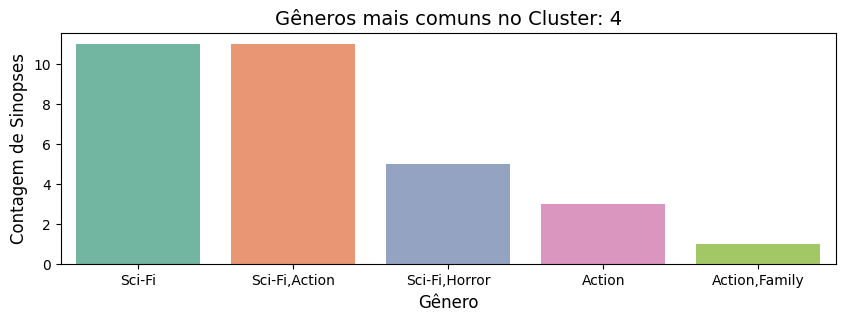

...

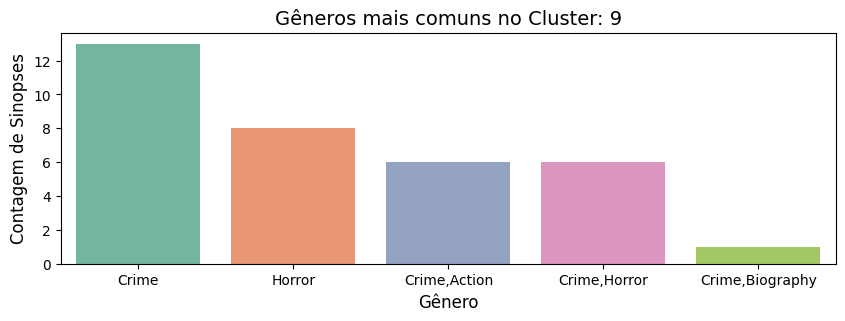

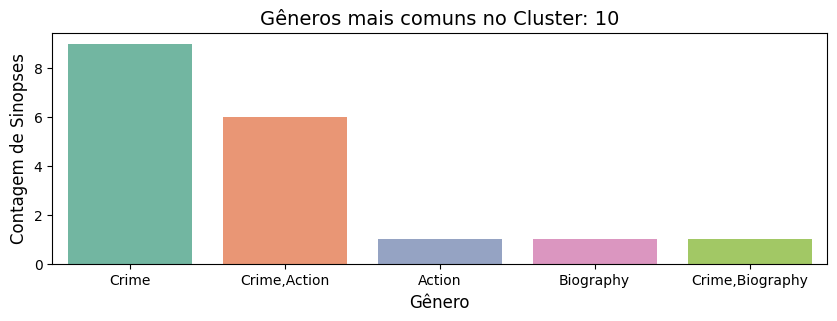

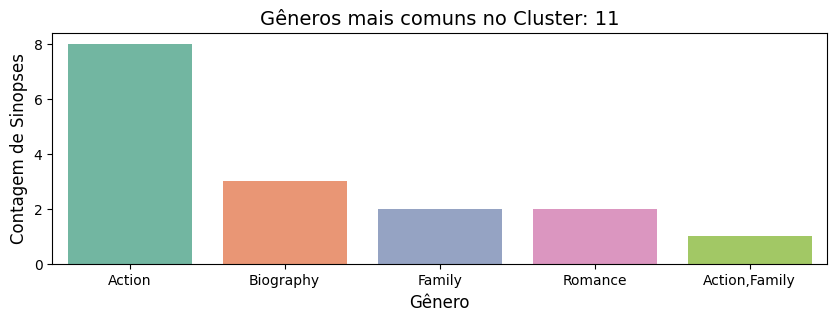

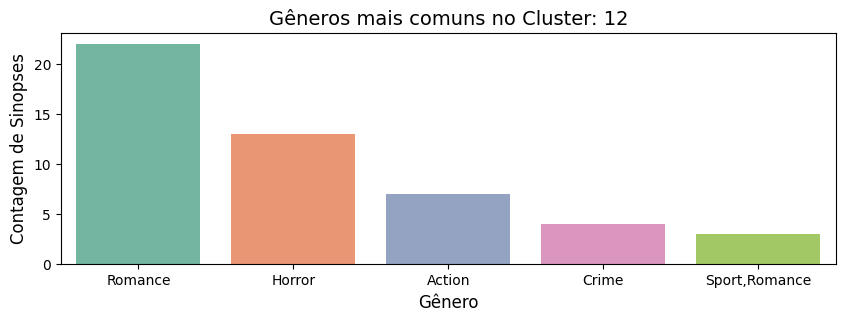

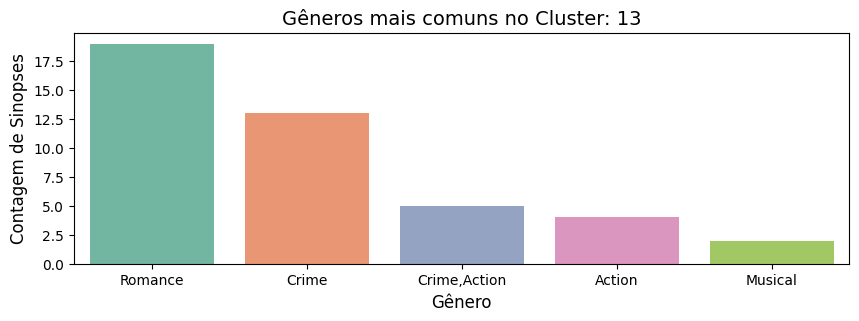

In [84]:
#Para 14 clusters
gera_graficos_gero_por_cluster(agrupamento_espectral_k14, todos_os_generos, 14)

### Nuvem de palavras

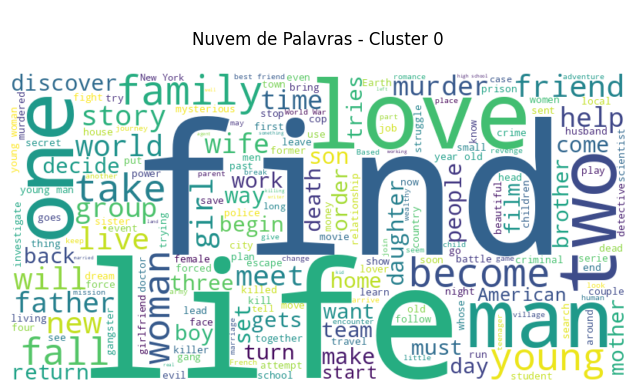

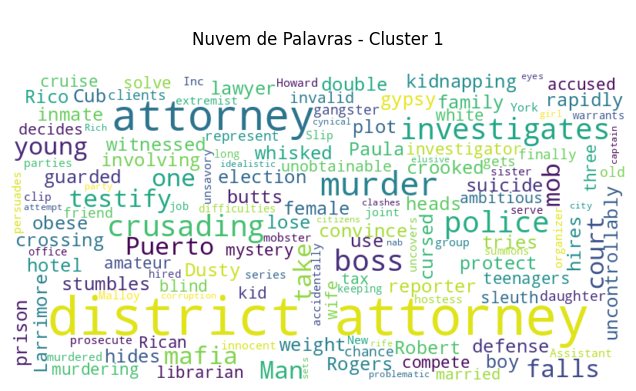

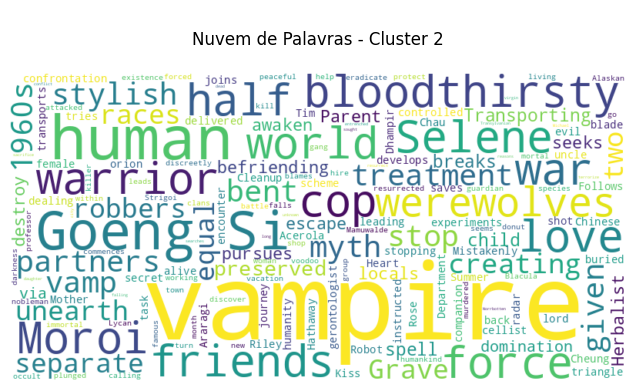

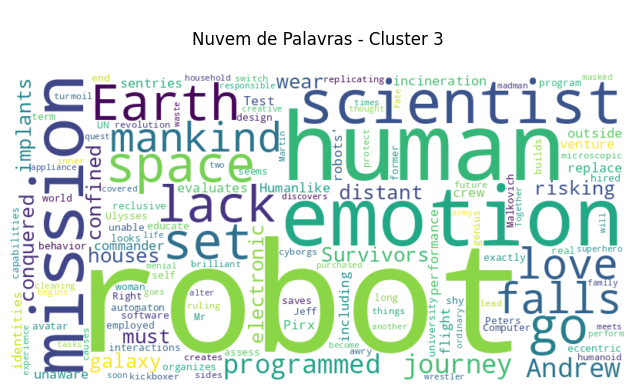

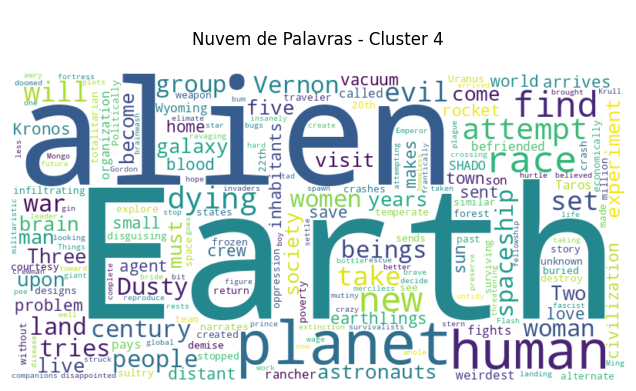

...

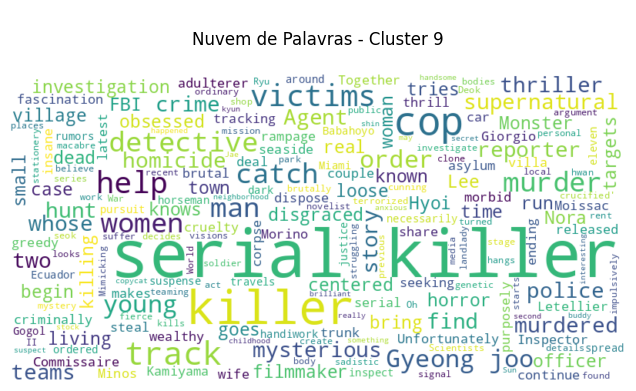

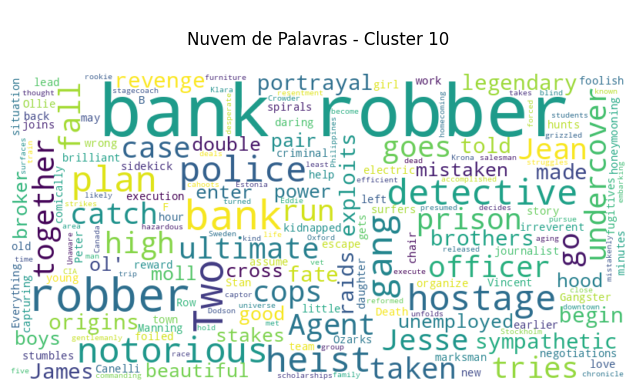

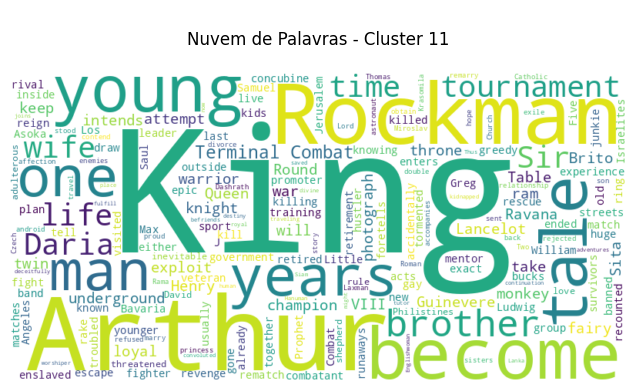

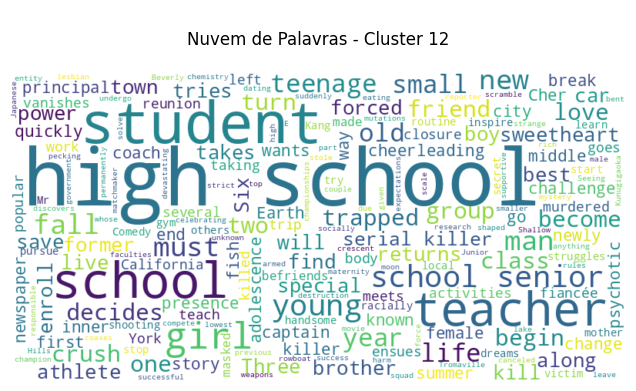

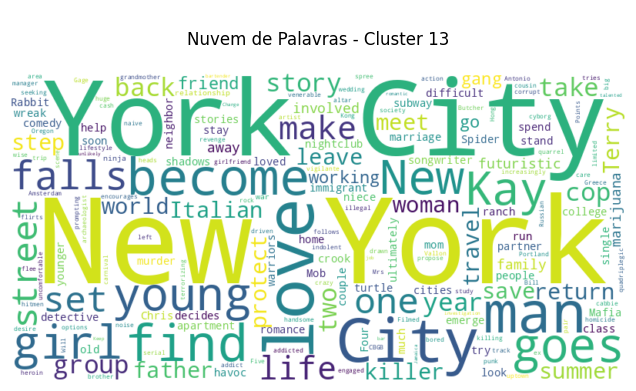

In [85]:
nuvem_palavras(agrupamento_espectral_k14, 'Cluster_sc')

## Análise dos resultados do Agrupamento espectral

Primeiramente, com 3 grupos notou-se um pequeno sinal nos dados, mas o grande desbalanceamento sugere que o modelo não se saiu tão bem lidando com a grande maioria das sinopses. Isso se repete nos experimentos com 7 e 14 clusters.

Em outras palavras, o cluster 0 agrupou a maioria das sinopses, onde os gêneros mais recorrentes foram exatamente aqueles com maior frequência nas no conjunto de dados. Isso coloca o cluster 0 como um grande absorvedor de ruído, onde não se explica muita coisa.

Em relação ao agrupamento com 7 clusters, o resultado foi mais interessante. Ignorando o cluster 0, cada um dos grupos apresentou um sinal específico de gêneros. O cluster 3, por exemplo, mostrou uma clara tendência ao horror, que pode ser observado também na nuvem de palavras, com termos como "vampiro" ou "sede por sangue". O cluster 6, por sua vez, absorveu o gênero "família", e é interessante notar que os termos frequentes são relacionados ao natal, o que é de certa forma intuitiva. Essas associações entre o gênero mais frequente de um cluster e palavras que são comuns nesses filmes também podem ser observadas em todos os clusters, exceto o 0.

Já o agrupamento com 14 grupos resultou em muita extratificação. Entretanto, ainda apresentou informações interessantes. Apesar de haverem diversos grupos para Crime, por exemplo, percebe-se que as palavras-chave em cada um deles são diferentes, mas orbitam coerentemente o gênero em questão. Enquanto o cluster 10 mostra palavras como "robber", "bank" e "hostages", o cluster 1 destaca os termos "attorney", "district" e "crusading". É como se um cluster agrupasse o lado do "bandido", enquanto o outro agrupa o seu oposto. Além disso, o grupo 9 aborta tokens como "victims", "serial", "killer", "detective", "catch", mostrando outra face do gênero de Crime.

Portanto, caso o objetivo fosse a simplificação e redução de clusters, o agrupamento com 7 grupos parece o melhor. Por outro lado, se o objetivo fosse observar sinais dentro de cada gênero, 14 cluster pare uma escolha mais viável, não esquecendo, claro, que nenhum agrupamento foi realmente satisfatório, pois não separou uma gama muito expressiva de dados.


---


Com isso, pode-se responder às perguntas do professor:

Há diferença nas distribuições de gêneros dos filmes em grupos diferentes?

R: sim, como apresentado no texto acima.

Há relação entre as sinopses dos filmes e os respectivos gêneros?

R: os resultados não permitem responder com exatidão, pois a grande maioria dos dados foram agrupados em um mesmo cluster. Entretanto, caso ignoremos o cluster 0, sinopses do mesmo gênero costumam carregar palavras-chave semelhantes.

# Conclusões

Como foi escolhido o número de componentes principais para o PCA? O número de componentes principais tem um impacto significativo nos resultados? É necessário usar PCA neste trabalho?


Como o número de grupos para cada algoritmo de agrupamento foi definido? A escolha do algoritmo de agrupamento impacta significativamente os resultados? E o número de grupos?

R: usando medidas como a heurística do cotovelo, análise de silhueta, e eigengap. A escolha dos algoritmos geraram resultados muito diferentes, incluindo números de clusters distintos.

Há diferença nas distribuições de gêneros dos filmes em grupos diferentes?

R: Sim, como exemplificado no final da seção de cada algoritmo.

Há relação entre as sinopses dos filmes e os respectivos gêneros?

R: Desconsiderando os ruídos e ineficiência resultados para os algoritmos que montei, sim, pois filmes do mesmo gênero compartilham palavras-chave



---

O trabalho foi muito interessante, mas muito complexo. Os sinais desses dados não foram fáceis de observar e os resultados foram incertos, todavia, algumas tendências foram notadas, principalmente no agrupamento espectral. O k-means, por sua vez, não pareceu lidar bem com dados textuais tão esparsos - e possivelmente não "circulares".

Outro ponto interessante de se ressaltar é a dificuldade de uma redução de dimensionalidade efetiva utilizando truncated-svd para uma matriz tf-idf tão esparsa e com dimensionalidade tão elevada. Os resultados desse trabalho foram obtidos em cima de um alicerce frágil de variância explicada, mesmo com valores altos de componentes, portanto, presume-se que parte do erro desse projeto deva estar alocado exatamente nessa etapa.